In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from mpl_toolkits.mplot3d import Axes3D
# Set global font properties
plt.rcParams['font.family'] = 'Serif'
plt.rcParams['font.size'] = 10.5

In [ ]:

#Reading raw data from .xslx format
FY18_raw = pd.read_excel('/content/1_FY18AshMoisture_Method1.xlsx',index_col = 0)
FY19_raw_1 = pd.read_excel('/content/2_FY19SelfDegradation_Method1.xlsx',index_col = 0)
FY19_raw_2 = pd.read_excel('/content/3_FY19VarienFractionsWithDegradation_Method1.xlsx',index_col = 0)
FY19_raw_combined = pd.read_excel('/content/4_FYWholeSelfDegradation_Method1.xlsx',index_col = 0)

In [ ]:
FY18 = FY18_raw.copy()
FY19_1 = FY19_raw_1.copy()
FY19_2 = FY19_raw_2.copy()

-----------------------------------
## **Year 18**

In [ ]:
#Separating ELements into a separate dataset in order to improve graph readability
FY18_elements = FY18[['Al2O3 (%)', 'CaO (%)', 'Fe2O3 (%)', 'K2O (%)',
       'MgO (%)', 'MnO (%)', 'Na2O (%)', 'P2O5 (%)', 'SiO2 (%)', 'SO3 (%)',
       'TiO2 (%)']].copy()

#Removing ' (%)' from elements datasets to improve readability
def percent_remover(column):
  return column.split(' (%)')[0]

FY18_elements.rename(mapper=percent_remover,axis = 1,inplace = True)

FY18.drop([ 'Ash (%, 575C)','Al2O3 (%)', 'CaO (%)', 'Fe2O3 (%)', 'K2O (%)',
       'MgO (%)', 'MnO (%)', 'Na2O (%)', 'P2O5 (%)', 'SiO2 (%)', 'SO3 (%)',
       'TiO2 (%)', 'Total ash (%, 750C)', 'Volatiles (%, db)', 'Ash (%, db)'],axis = 1,inplace = True)

<ipython-input-54-e14872e22895>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


21


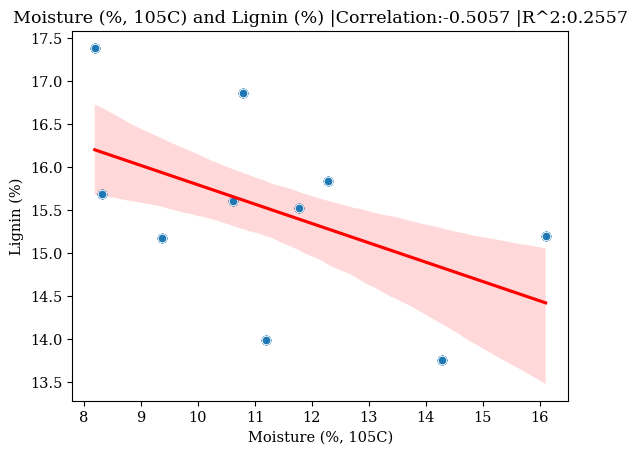

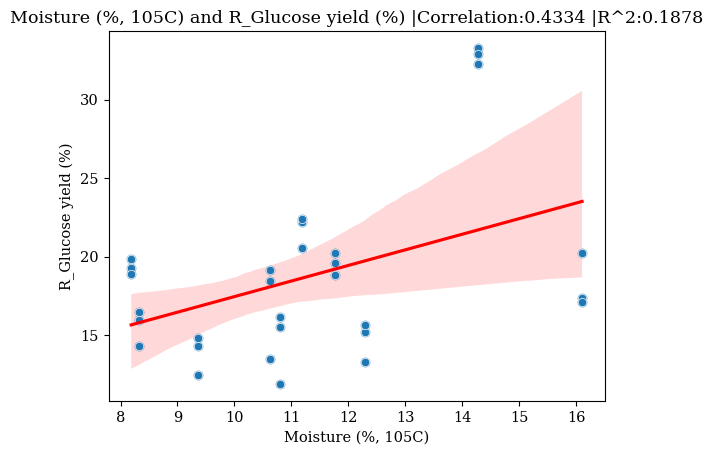

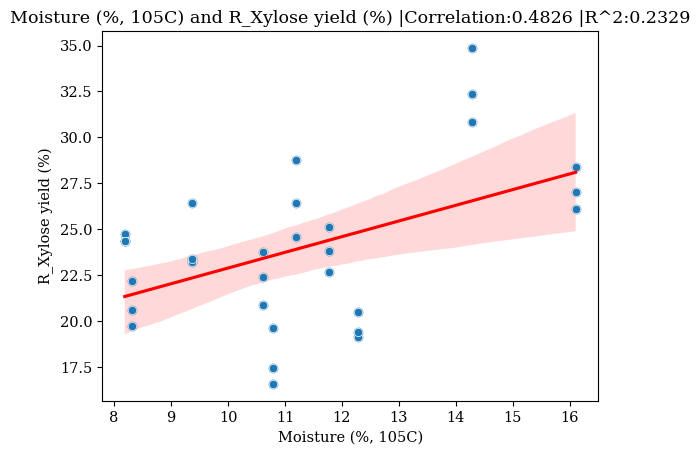

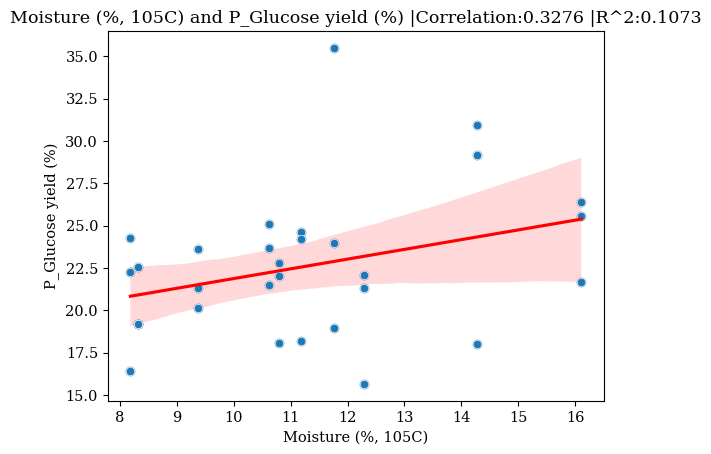

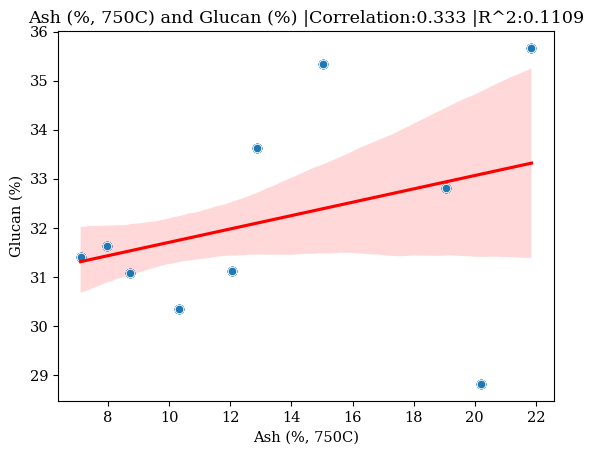

...

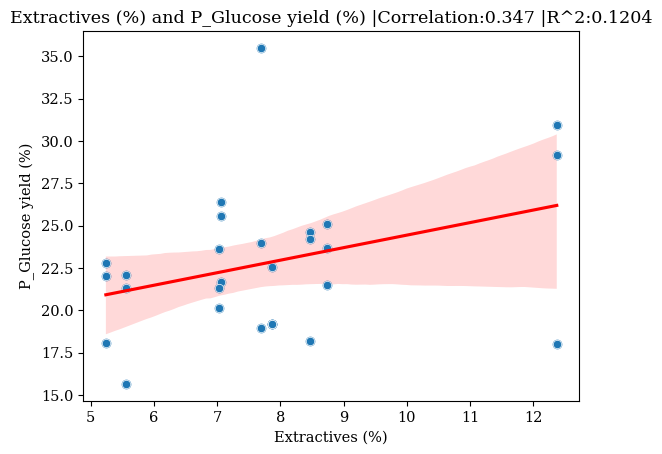

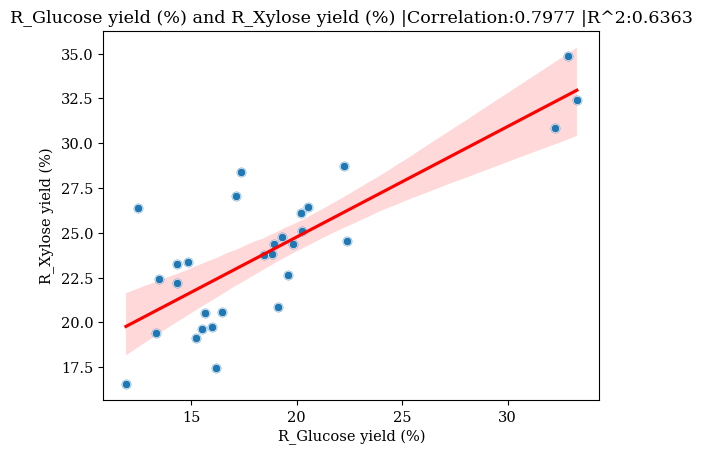

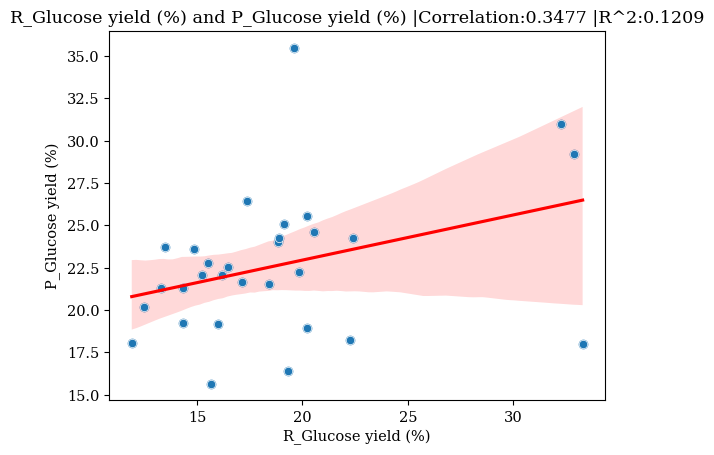

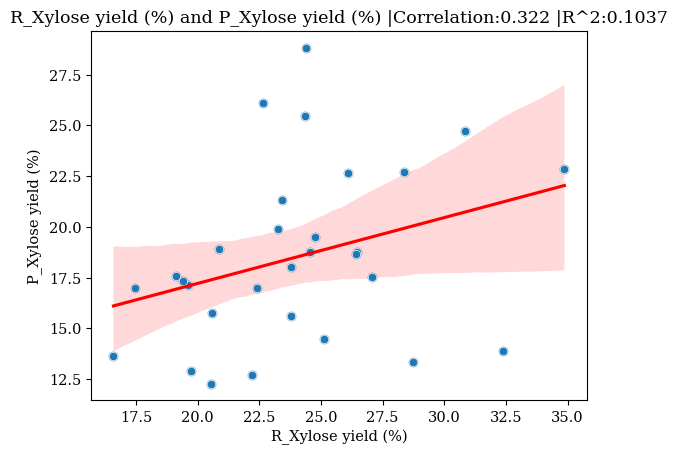

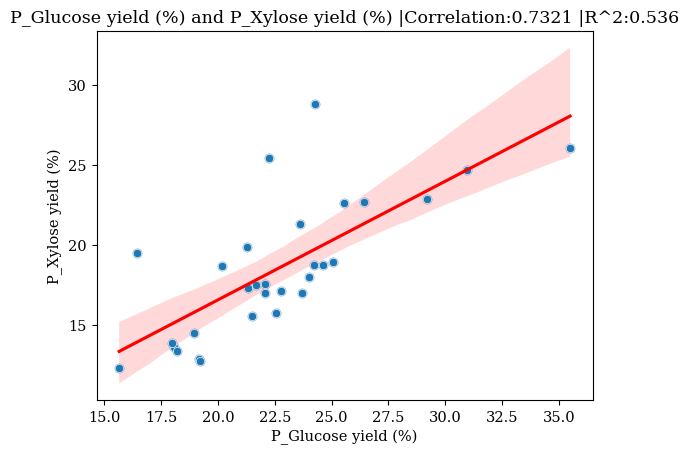

In [ ]:
#Grabbing all FY18 column and calculating the R^2 score between each element. Only a score of higher than 0.1 is shown
year_18_columns = FY18.columns

counter = 0
for i in range(len(year_18_columns)):
  for j in range(i+1, len(year_18_columns)):
    col1 = year_18_columns[i]
    col2 = year_18_columns[j]
    try:
            FY18[col1] = FY18[col1].astype(float)
            FY18[col2] = FY18[col2].astype(float)
    except ValueError:
          continue
    if FY18[col1].dtype == 'float64' and FY18[col2].dtype == 'float64':
      correlation = round(FY18[[col1, col2]].corr().iloc[0,1],4)
      if abs(correlation * correlation) > 0.1:
        counter+=1
        plt.figure()
        sns.regplot(data=FY18, x=col1, y=col2, line_kws={'color': 'red'})
        plt.title(f'{col1} and {col2} |Correlation:{correlation} |R^2:{round(np.square(correlation),4)}')
        sns.scatterplot(data=FY18,x=col1,y=col2)
print(counter)

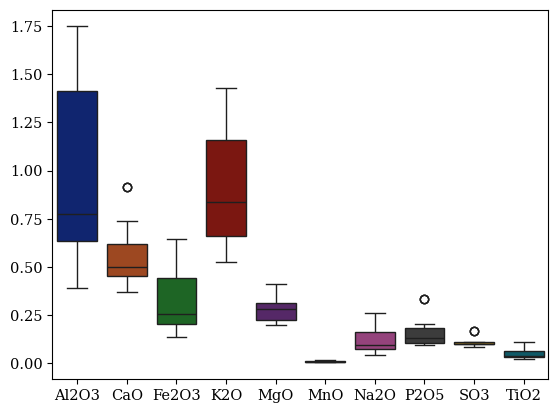

In [ ]:
#Showing distribution of elements within the ash present in each sample. SiO2 is excluded in this graph
sns.boxplot(FY18_elements.loc[:, FY18_elements.columns != 'SiO2'],palette = 'dark')
plt.show()

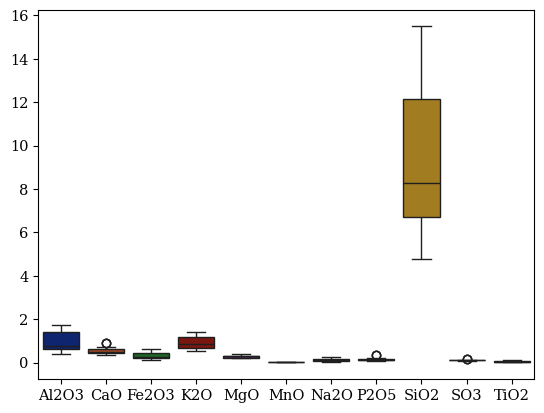

In [ ]:
#SiO2 is included here
sns.boxplot(FY18_elements,palette = 'dark')
plt.show()

Text(0.5, 1.0, 'Correlation_Pretreated:-0.4915|Correlation_As_Is:-0.253|R^2_Pretreated:0.2416|R^2_As_Is:0.064')

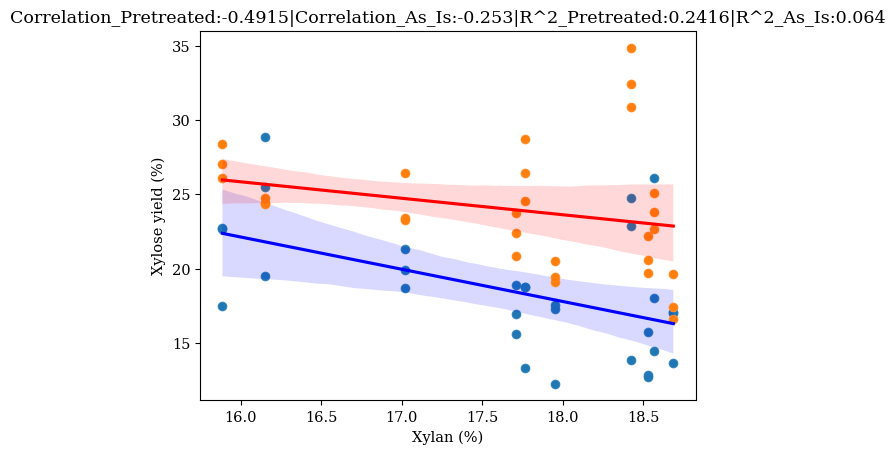

In [ ]:
sns.scatterplot(data=FY18, x='Xylan (%)', y='P_Xylose yield (%)')
sns.regplot(data=FY18, x='Xylan (%)', y='P_Xylose yield (%)', line_kws={'color': 'blue'})
sns.scatterplot(data=FY18, x='Xylan (%)', y='R_Xylose yield (%)')
sns.regplot(data=FY18, x='Xylan (%)', y='R_Xylose yield (%)', line_kws={'color': 'red'})
correlation_pretreated = round(FY18[['Xylan (%)', 'P_Xylose yield (%)']].corr().iloc[0,1],4)
correlation_asis = round(FY18[['Xylan (%)', 'R_Xylose yield (%)']].corr().iloc[0,1],4)

plt.ylabel('Xylose yield (%)')
plt.title(f'Correlation_Pretreated:{correlation_pretreated}|Correlation_As_Is:{correlation_asis}|R^2_Pretreated:{round(np.square(correlation_pretreated),4)}|R^2_As_Is:{round(np.square(correlation_asis),4)}')
#Red is "As is Xylose yield (%)" and blue is "Pretreated Xylose yield (%)""

Text(0.5, 1.0, 'Heatmap of Correlations')

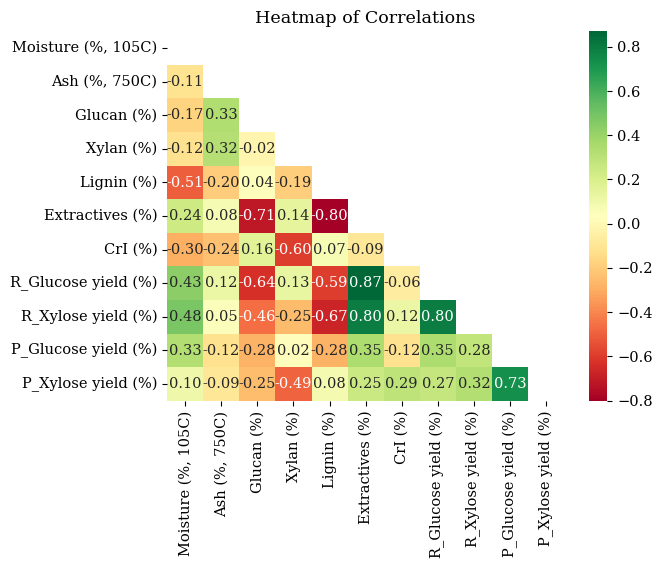

In [ ]:
#All correlations between each column in the dataset
float_columns = FY18.select_dtypes(include=['float64']).columns
corr_matrix = FY18[float_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of Correlations')

Text(0.5, 1.0, 'Heatmap of R^2 Scores')

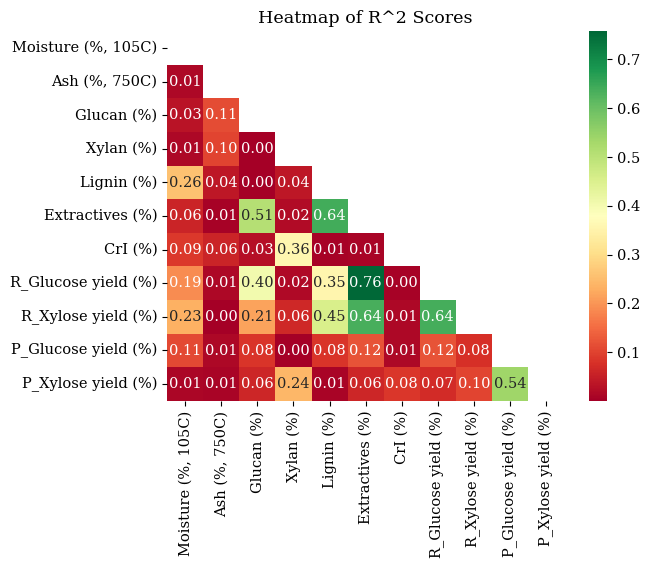

In [ ]:
#All R^2 score between each column in dataset
float_columns = FY18.select_dtypes(include=['float64']).columns
r2_matrix = FY18[float_columns].corr()**2
mask = np.triu(np.ones_like(r2_matrix, dtype=bool))
sns.heatmap(r2_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of R^2 Scores')

11


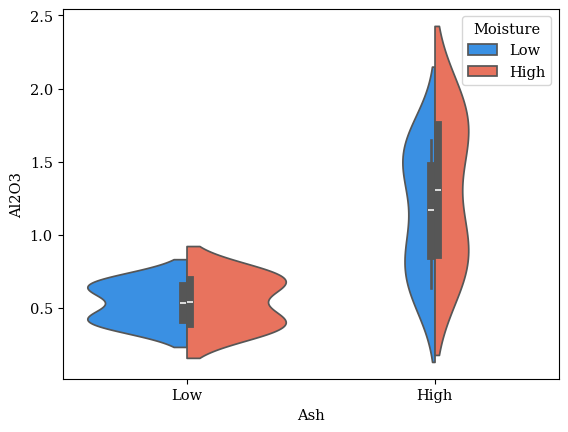

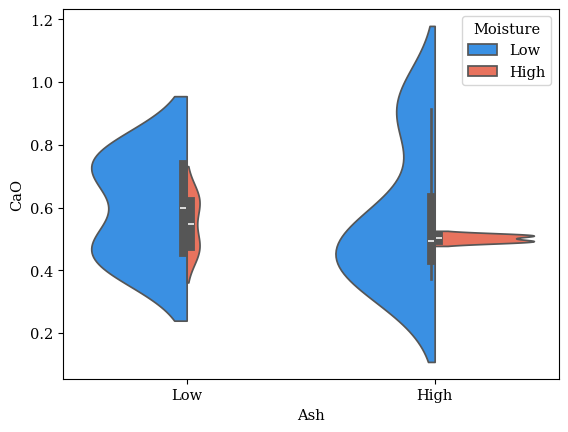

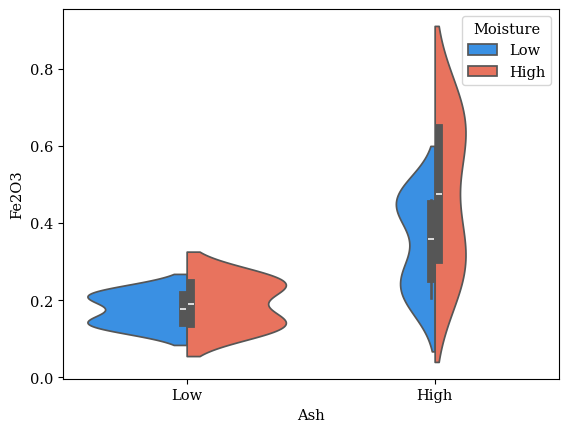

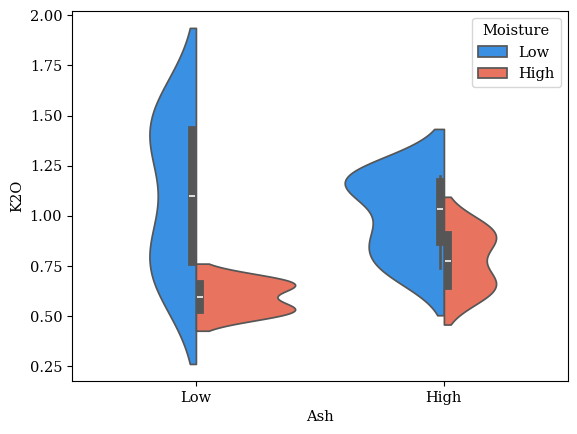

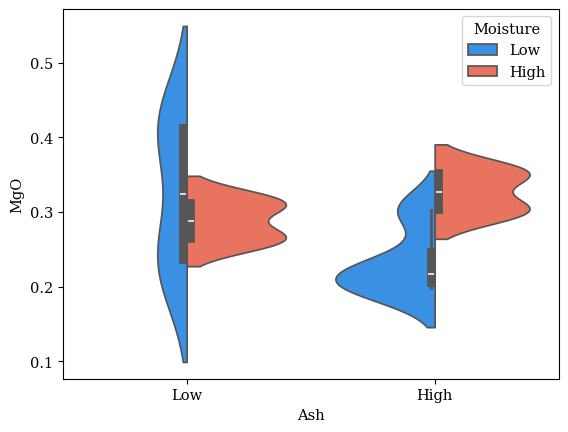

...

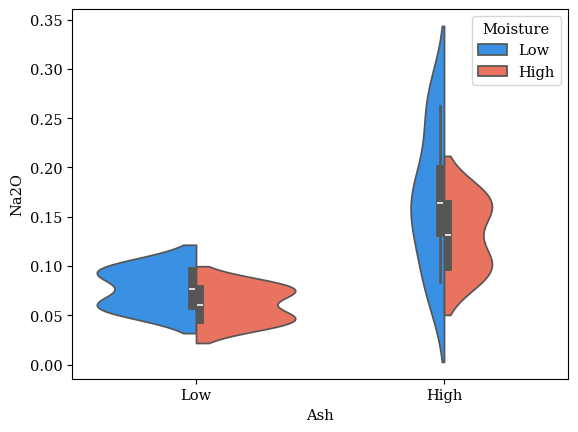

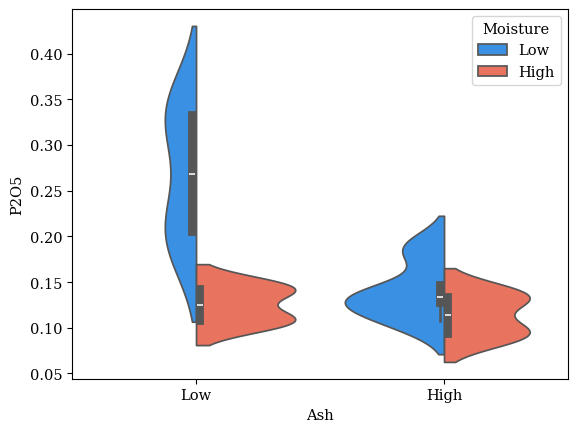

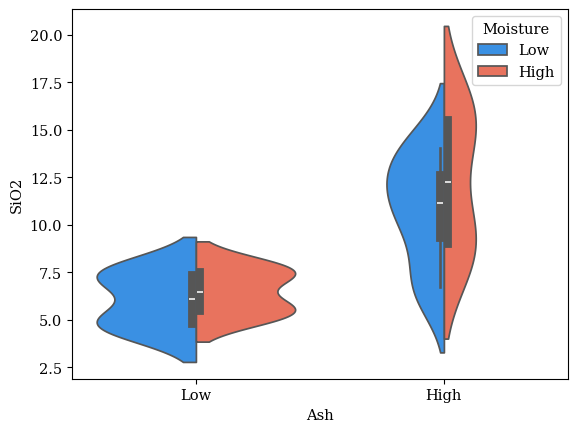

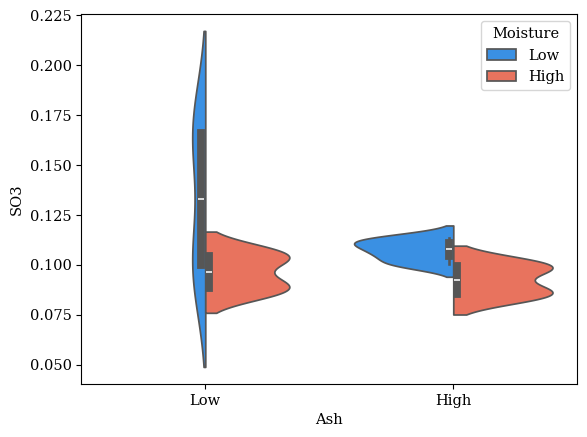

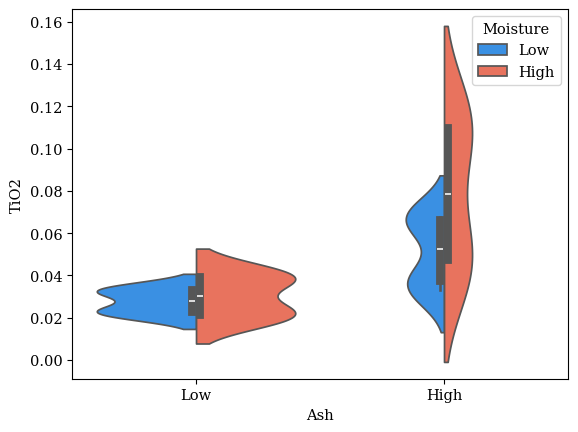

<Figure size 640x480 with 0 Axes>

In [ ]:
#Violin plot for elements in the element dataset, grouped by Ash and Moisture level.
counter = 0
FY18_element_columns = FY18_elements.columns
for i in FY18_element_columns:
    counter = counter + 1
    col1 = FY18_elements[i]
    sns.violinplot(x="Ash", y=col1, hue="Moisture", palette = ['dodgerBlue','tomato'], data=FY18_raw, split=True)
    plt.figure()
print(counter)

11


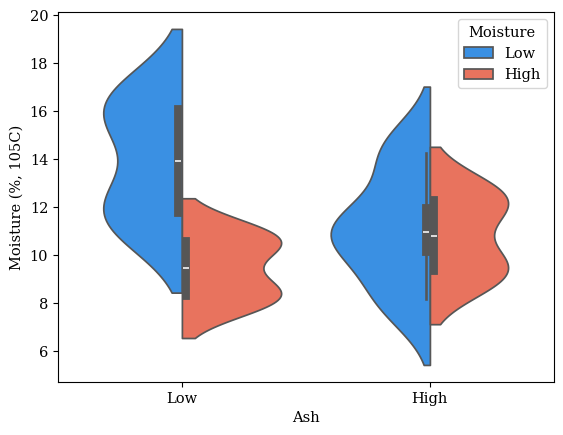

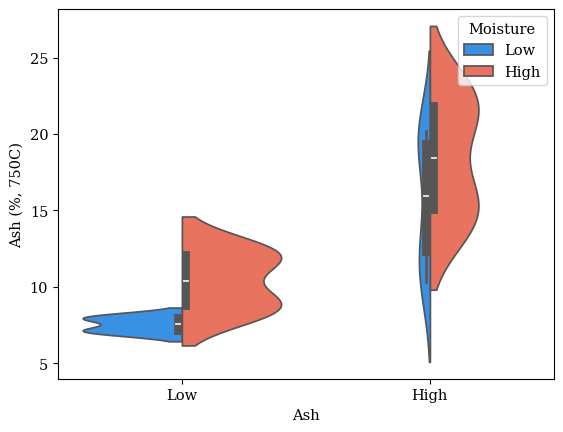

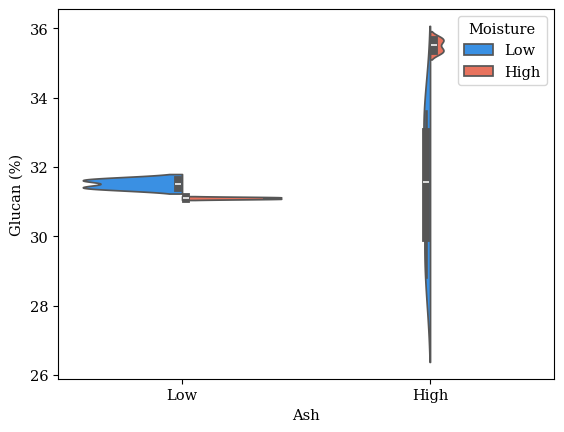

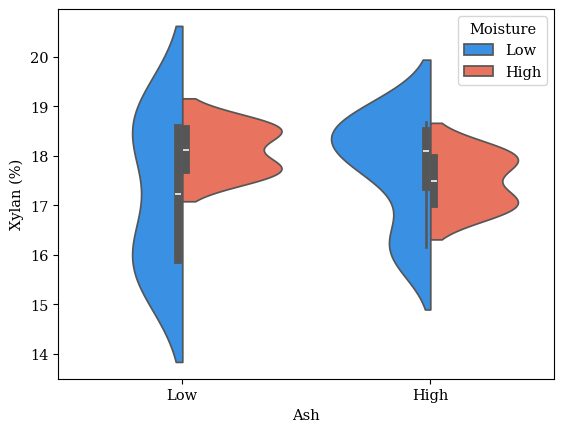

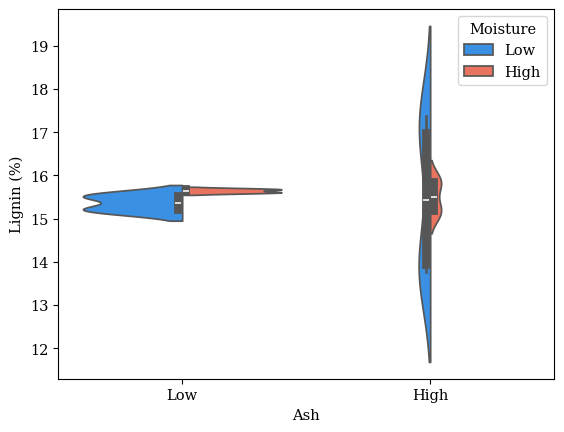

...

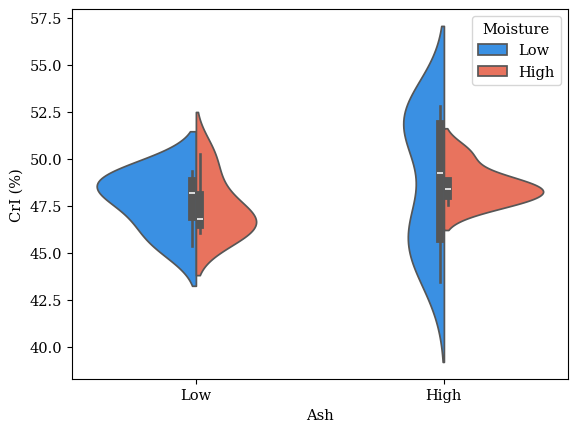

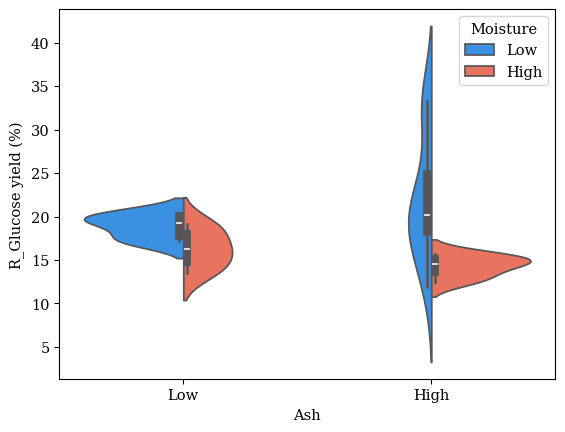

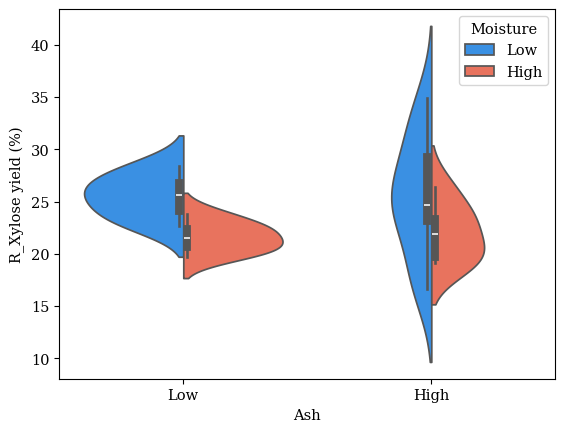

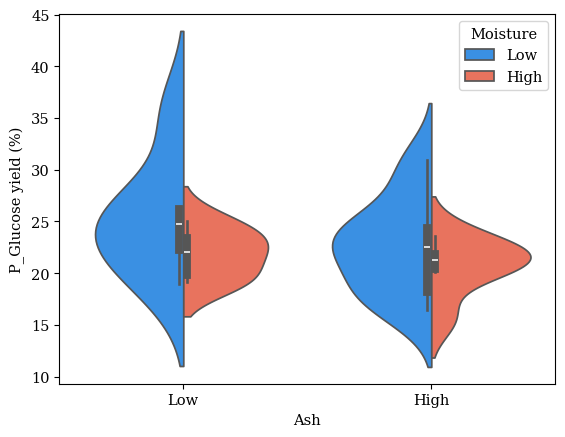

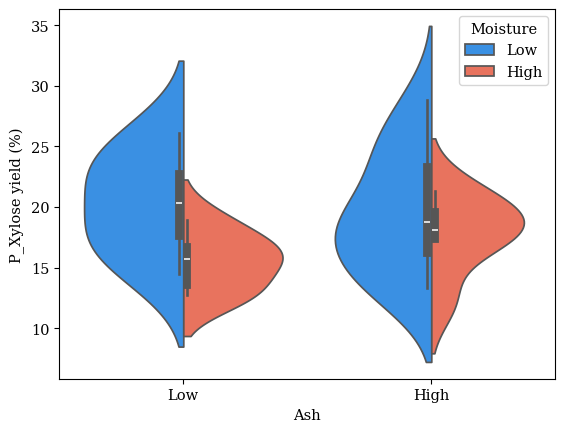

<Figure size 640x480 with 0 Axes>

In [ ]:
#Violin plot again, this time for the main FY18 dataset
counter = 0
FY18_columns = FY18.loc[:, ~FY18.columns.isin(['Bale No.','Ash','Moisture'])].columns
for i in FY18_columns:
    counter = counter + 1
    col1 = FY18[i]
    sns.violinplot(x="Ash", y=col1, hue="Moisture", palette = ['dodgerBlue','tomato'], data=FY18_raw, split=True)
    plt.figure()
print(counter)

-----------------------------------
## **Year 19**

In [ ]:
FY19_1 = FY19_raw_1.copy()
FY19_1.columns

Index(['Bale No.', 'Ash', 'Moisture', 'Self-heated?', 'Section of the plant',
       'Moisture (%)', 'Glucan (%)', 'Xylan (%)', 'Lignin (%)',
       'Extractives (%)', 'Ash (%, 575C)', 'Al2O3 (%)', 'CaO (%)', 'Fe2O3 (%)',
       'K2O (%)', 'MgO (%)', 'MnO (%)', 'Na2O (%)', 'P2O5 (%)', 'SiO2 (%)',
       'SO3 (%)', 'TiO2 (%)', 'Total ash (%, 750C)', 'Volatiles (%, db)',
       'CrI (%)', 'R_Glucose yield (%)', 'R_Xylose yield (%)',
       'P_Glucose yield (%)', 'P_Xylose yield (%)'],
      dtype='object')

In [ ]:
#Repeating similar procedures as with FY18
FY19_1_elements = FY19_1[['Al2O3 (%)', 'CaO (%)', 'Fe2O3 (%)', 'K2O (%)',
       'MgO (%)', 'MnO (%)', 'Na2O (%)', 'P2O5 (%)', 'SiO2 (%)', 'SO3 (%)',
       'TiO2 (%)']].copy()


#Removing ' (%)' from elements datasets to improve readability
def percent_remover(column):
  return column.split(' (%)')[0]

FY19_1_elements.rename(mapper=percent_remover,axis = 1,inplace = True)

FY19_1.drop([ 'Ash (%, 575C)','Al2O3 (%)', 'CaO (%)', 'Fe2O3 (%)', 'K2O (%)',
       'MgO (%)', 'MnO (%)', 'Na2O (%)', 'P2O5 (%)', 'SiO2 (%)', 'SO3 (%)',
       'TiO2 (%)', 'Total ash (%, 750C)', 'Volatiles (%, db)',],axis = 1,inplace = True)

11


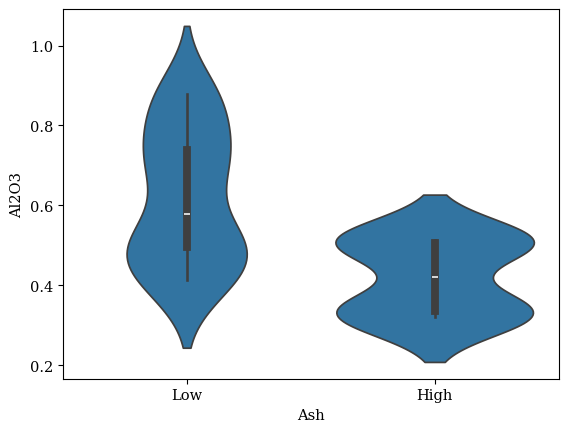

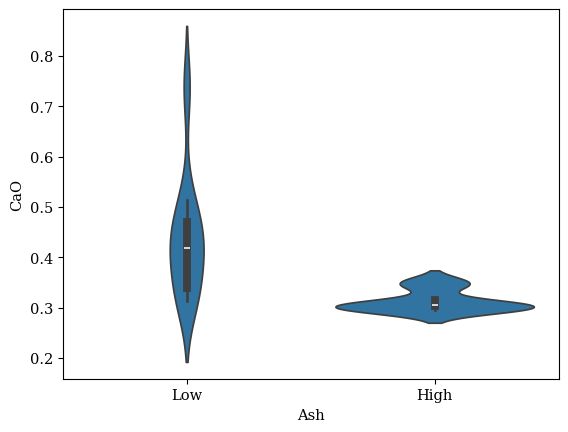

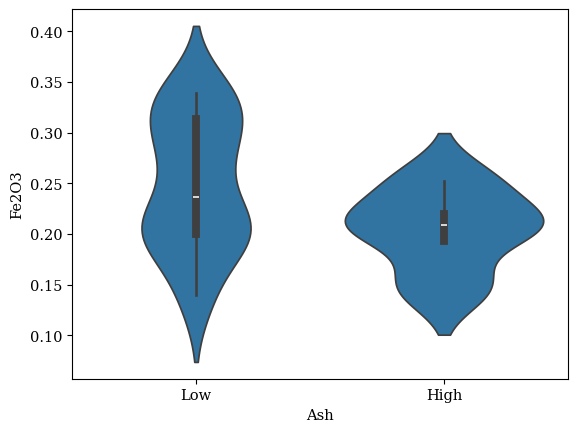

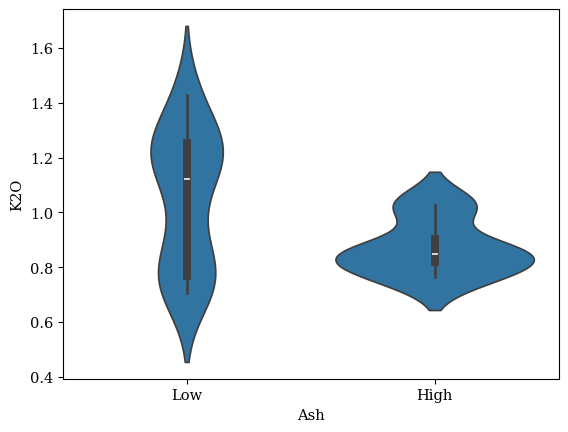

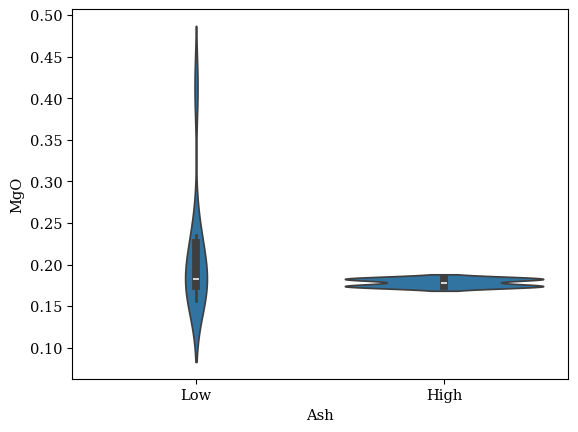

...

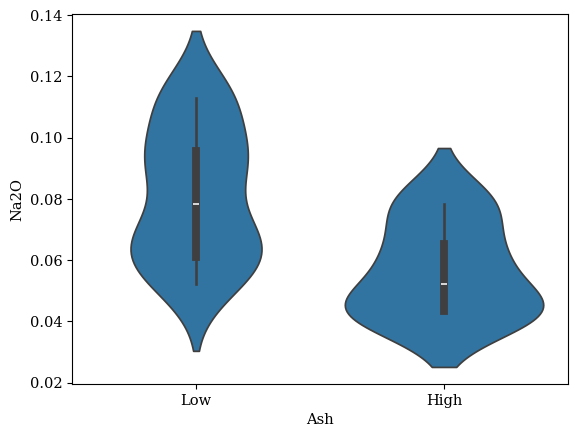

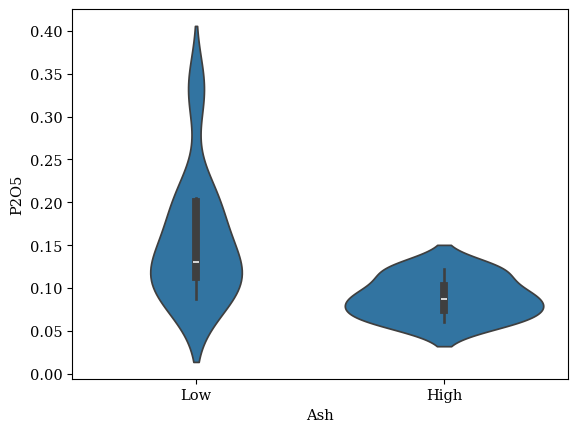

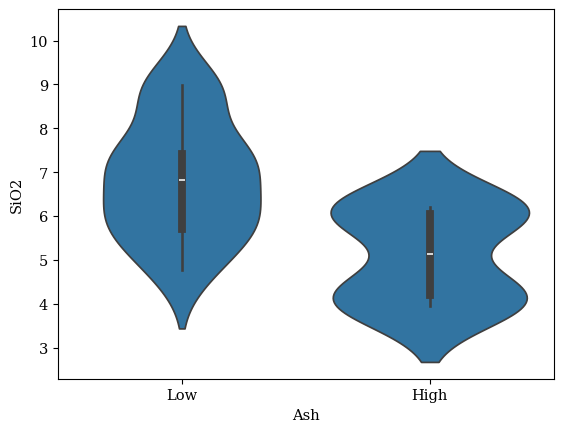

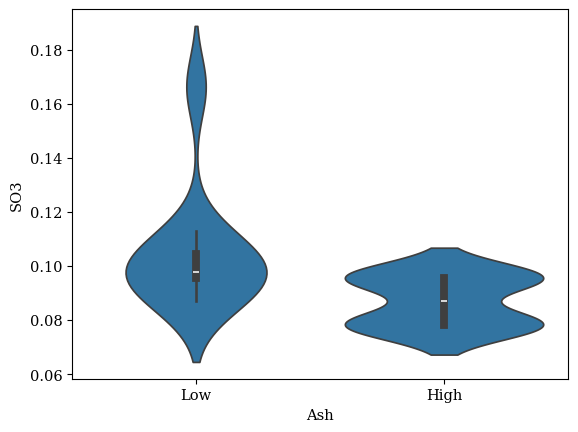

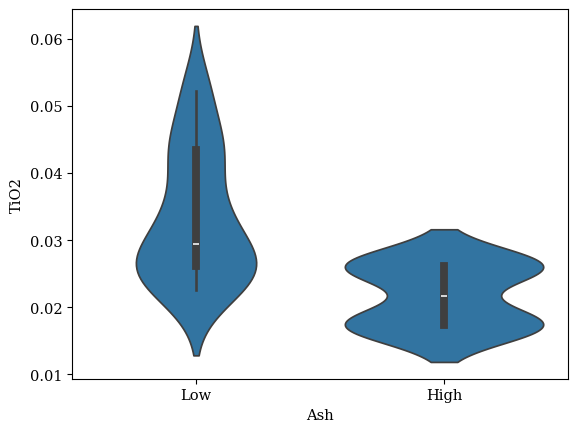

<Figure size 640x480 with 0 Axes>

In [ ]:
#A violin plot for the elements. This time only grouped by Ash content
counter = 0
FY19_1_element_columns = FY19_1_elements.columns
for i in FY19_1_element_columns:
    counter = counter + 1
    col1 = FY19_1_elements[i]
    sns.violinplot(x="Ash", y=col1, data=FY19_raw_1)
    plt.figure()
print(counter)

<ipython-input-65-366f1e60eb11>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


36


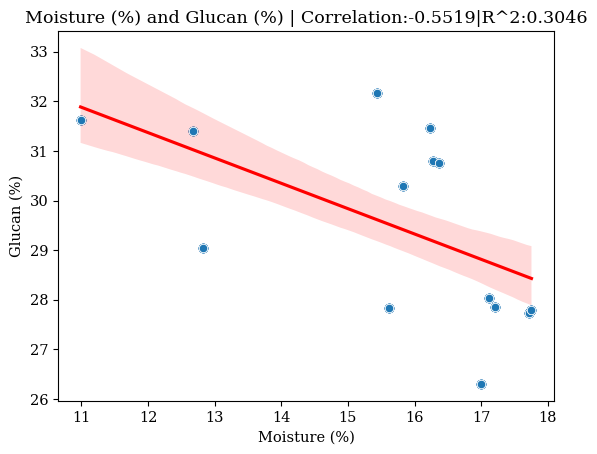

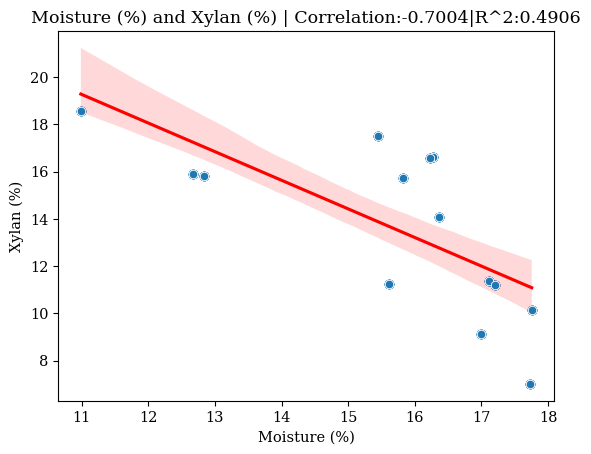

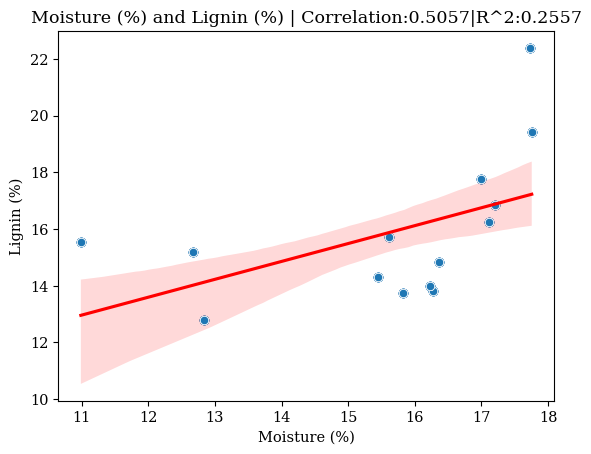

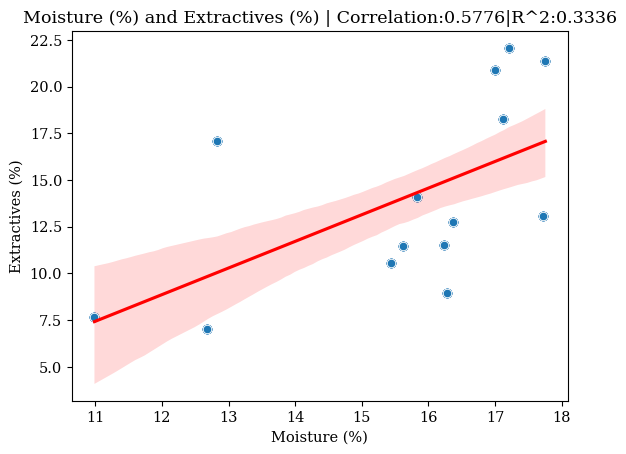

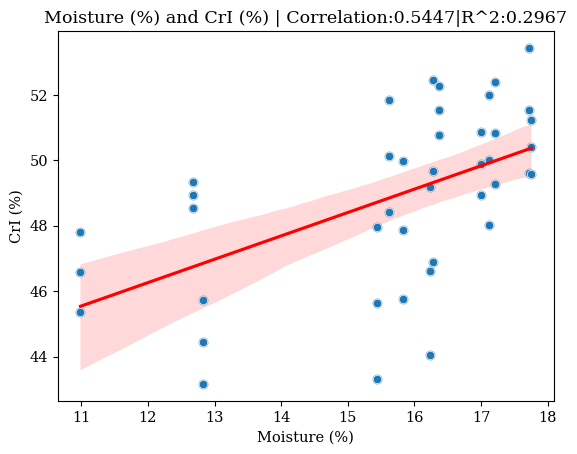

...

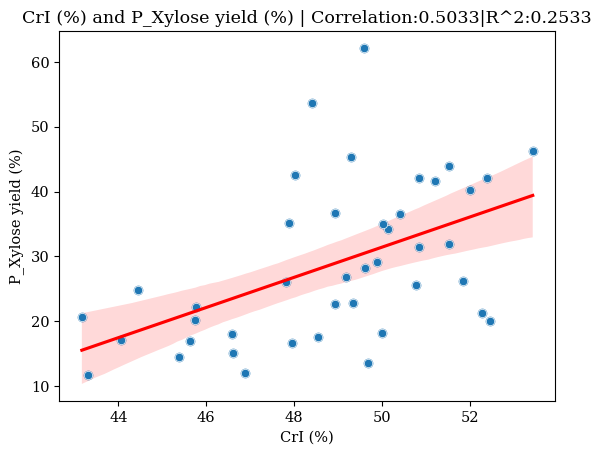

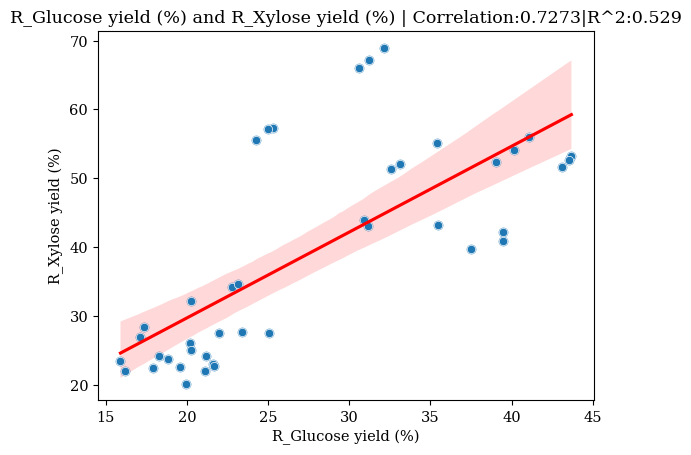

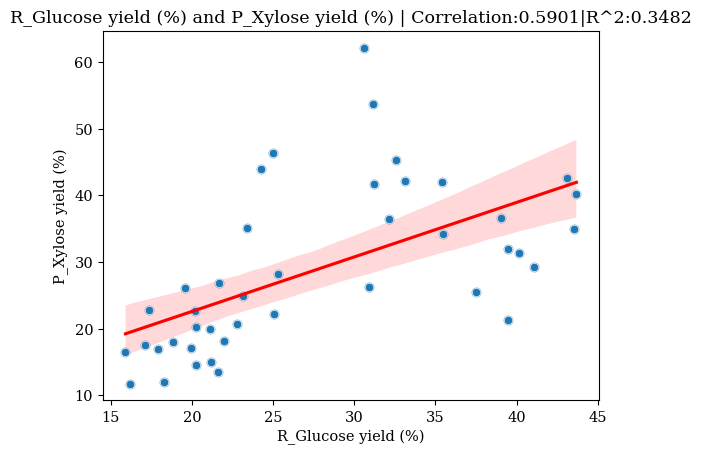

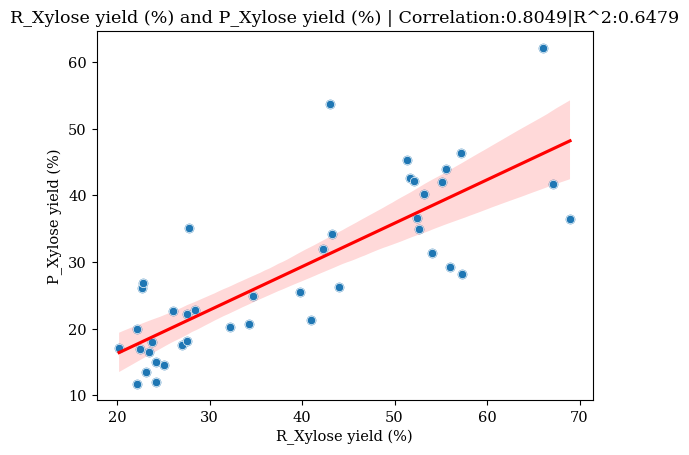

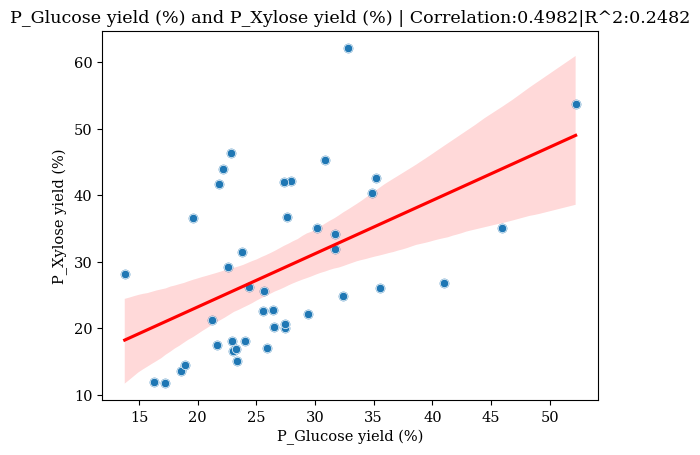

In [ ]:
#Similarly with FY18, a correlation between the columns is shown, with a minimum R^2 score of 0.1 chosen.
year_19_columns = FY19_1.columns

counter = 0
for i in range(len(year_19_columns)):
  for j in range(i+1, len(year_19_columns)):
    col1 = year_19_columns[i]
    col2 = year_19_columns[j]
    try:
            FY19_1[col1] = FY19_1[col1].astype(float)
            FY19_1[col2] = FY19_1[col2].astype(float)
    except ValueError:
          continue
    if FY19_1[col1].dtype == 'float64' and FY19_1[col2].dtype == 'float64':
      correlation = round(FY19_1[[col1, col2]].corr().iloc[0,1],4)
      if abs(correlation * correlation) > 0.10:
        counter+=1
        plt.figure()
        sns.regplot(data=FY19_1, x=col1, y=col2, line_kws={'color': 'red'})
        plt.title(f'{col1} and {col2} | Correlation:{correlation}|R^2:{round(np.square(correlation),4)}')
        sns.scatterplot(data=FY19_1,x=col1,y=col2)
print(counter)

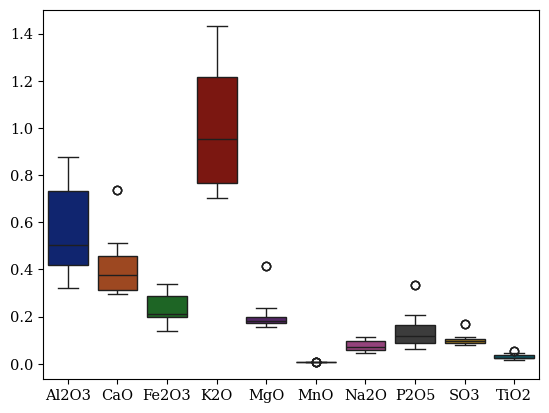

In [ ]:
sns.boxplot(FY19_1_elements.loc[:, FY19_1_elements.columns != 'SiO2'],palette = 'dark')
plt.show()

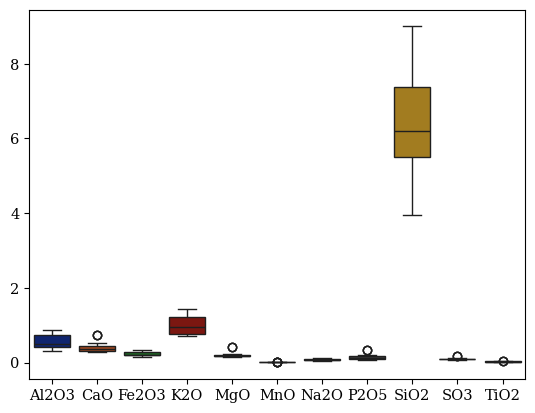

In [ ]:
sns.boxplot(FY19_1_elements,palette = 'dark')
plt.show()

Text(0.5, 1.0, 'Heatmap of Correlations')

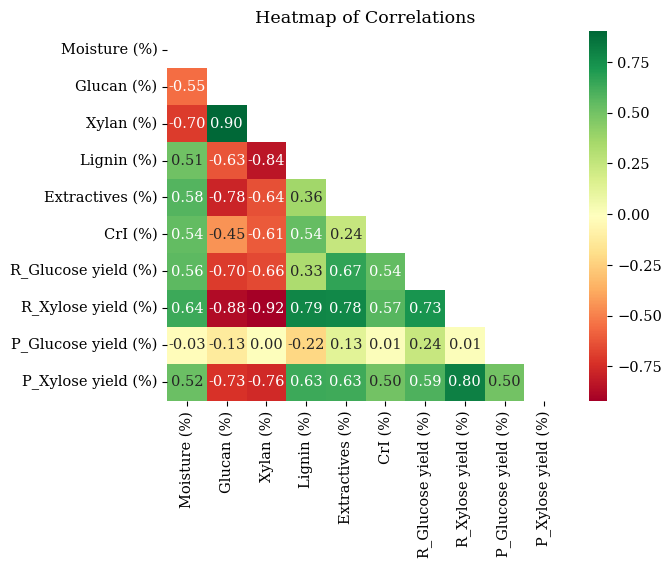

In [ ]:
float_columns = FY19_1.select_dtypes(include=['float64']).columns
corr_matrix = FY19_1[float_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of Correlations')

Text(0.5, 1.0, 'Heatmap of R^2 Scores')

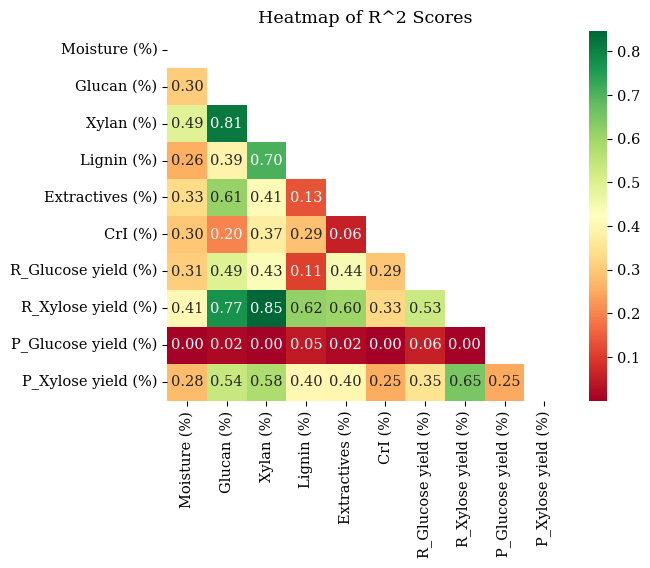

In [ ]:
float_columns = FY19_1.select_dtypes(include=['float64']).columns
r2_matrix = FY19_1[float_columns].corr()**2
mask = np.triu(np.ones_like(r2_matrix, dtype=bool))
sns.heatmap(r2_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of R^2 Scores')

4


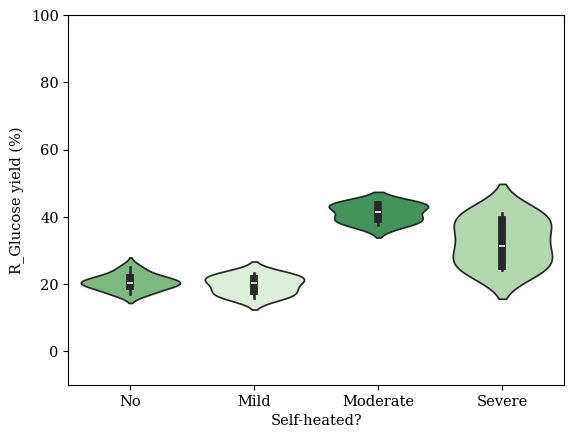

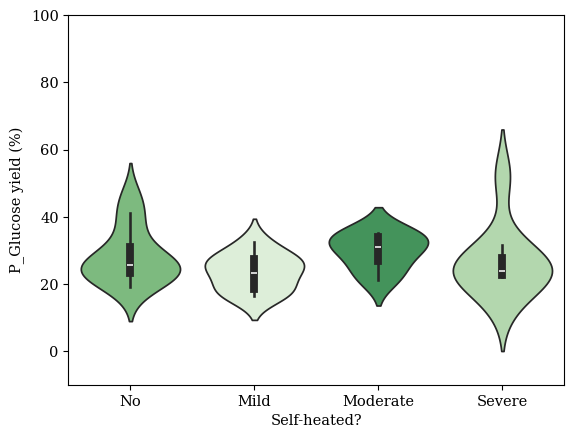

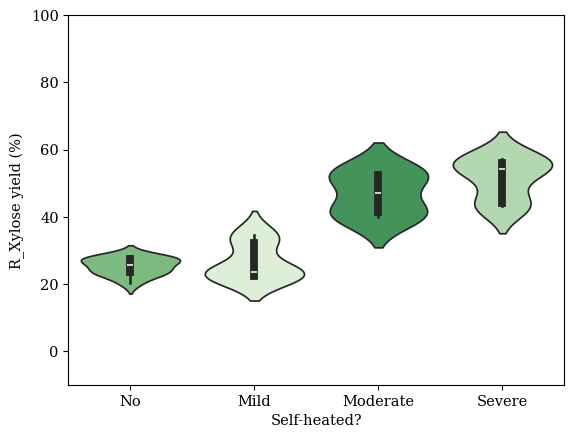

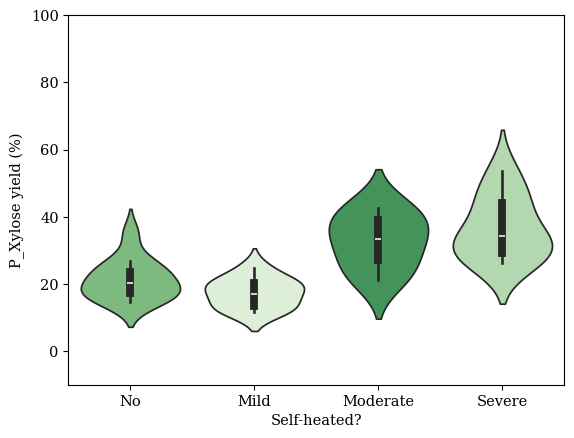

<Figure size 640x480 with 0 Axes>

In [ ]:
#Sugar yield grouped by the degree of self degragation
counter = 0
FY19_1_no_heated = FY19_1[FY19_1['Self-heated?'] != 'Heated']
FY19_1_sugar_columns = FY19_1[['R_Glucose yield (%)', 'P_Glucose yield (%)','R_Xylose yield (%)','P_Xylose yield (%)']]
for i in FY19_1_sugar_columns:
    counter = counter + 1
    col1 = FY19_1_no_heated[i]
    sns.violinplot(x="Self-heated?", y=col1,palette = 'Greens',hue = "Self-heated?", data=FY19_1,order = ['No','Mild','Moderate','Severe'])
    plt.ylim(-10,100)
    plt.figure()
print(counter)

**FY19_2**

In [ ]:
FY19_2 = FY19_raw_2.copy()
FY19_2.columns

Index(['Bale No.', 'Ash', 'Moisture', 'Self-heated',
       'Section of the plant (Fractioned)', 'Fraction weight (%)',
       'Glucan (%)', 'Xylan (%)', 'Lignin (%)', 'Extractives (%)', 'Ash (%)',
       'CrI (%)', 'R_Glucose yield (%)', 'R_Xylose yield (%)',
       'P_Glucose yield (%)', 'P_Xylose yield (%)'],
      dtype='object')

4


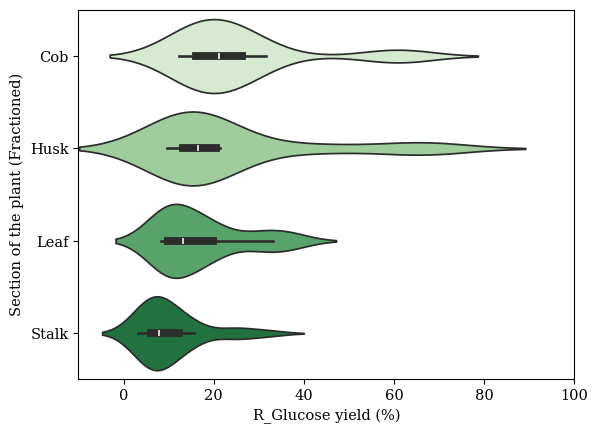

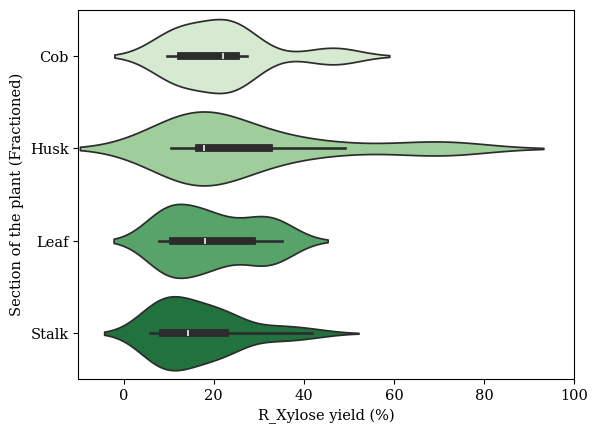

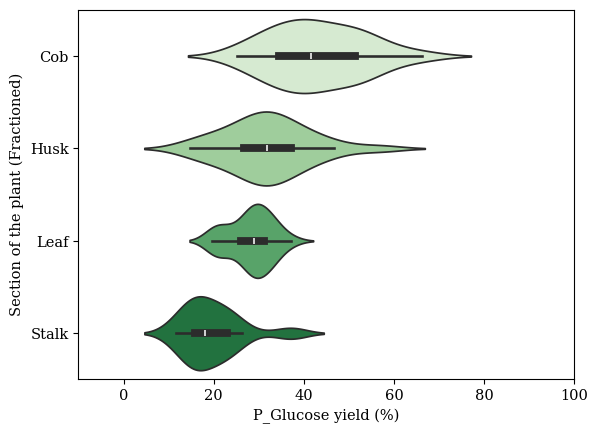

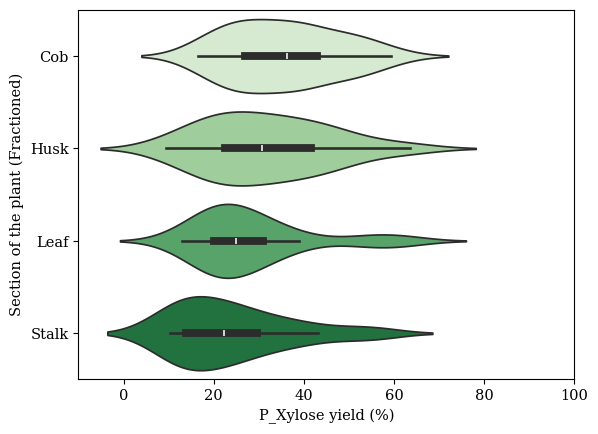

<Figure size 640x480 with 0 Axes>

In [ ]:
#Various sugar yields based on the section of the plant. Exclusive to FY19_2 dataset
counter = 0
FY19_2_sugar_columns = FY19_2[['R_Glucose yield (%)','R_Xylose yield (%)', 'P_Glucose yield (%)','P_Xylose yield (%)']]
for i in FY19_2_sugar_columns:
    counter = counter + 1
    col1 = FY19_2[i]
    sns.violinplot(x = col1, y="Section of the plant (Fractioned)",hue = "Section of the plant (Fractioned)",palette = 'Greens', data=FY19_2)
    plt.xlim(-10,100)
    plt.figure()
print(counter)

16


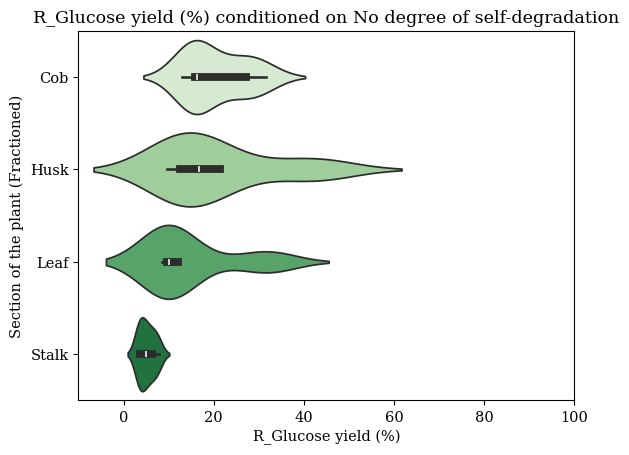

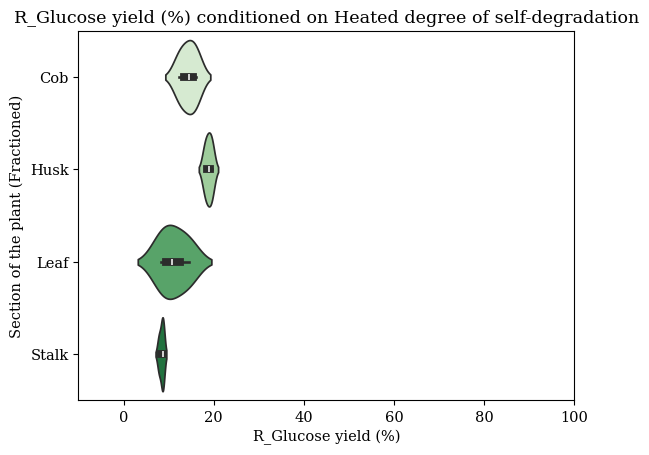

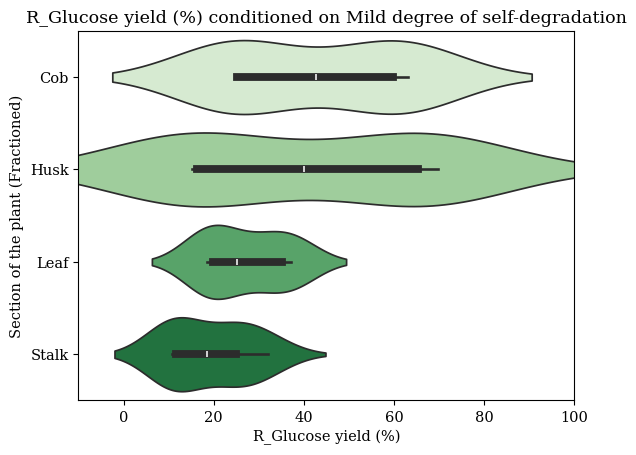

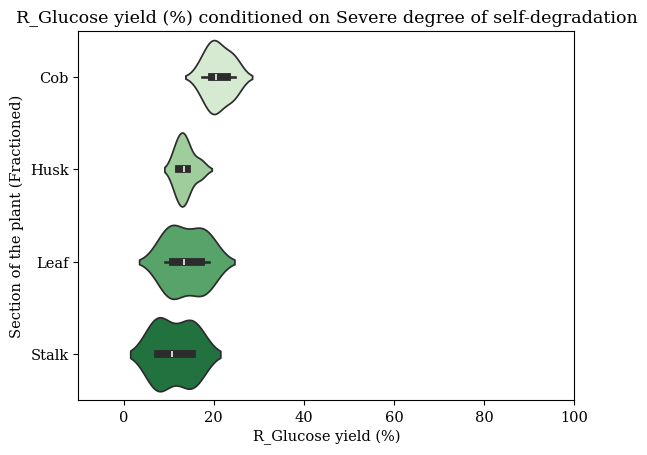

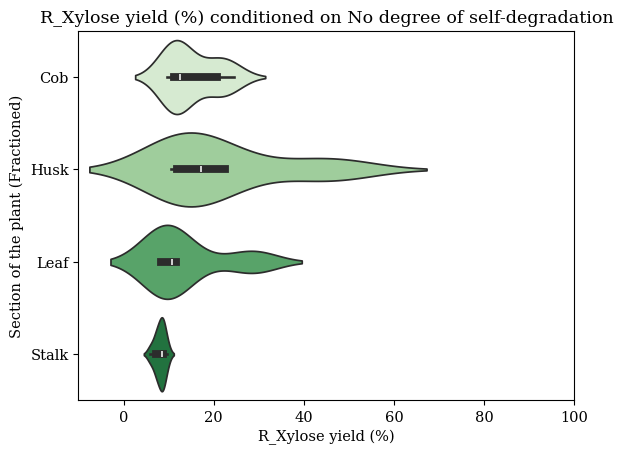

...

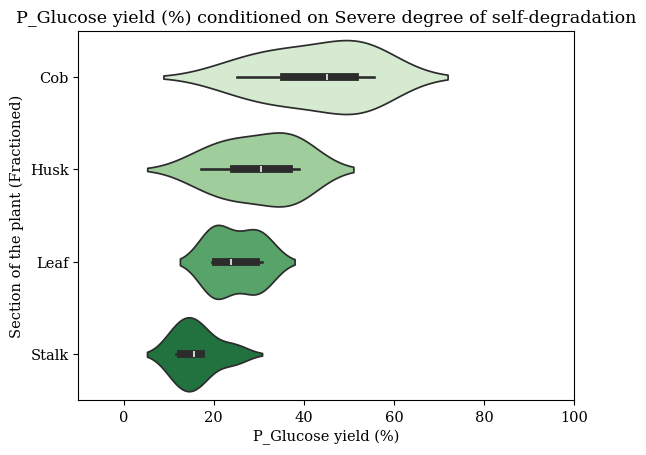

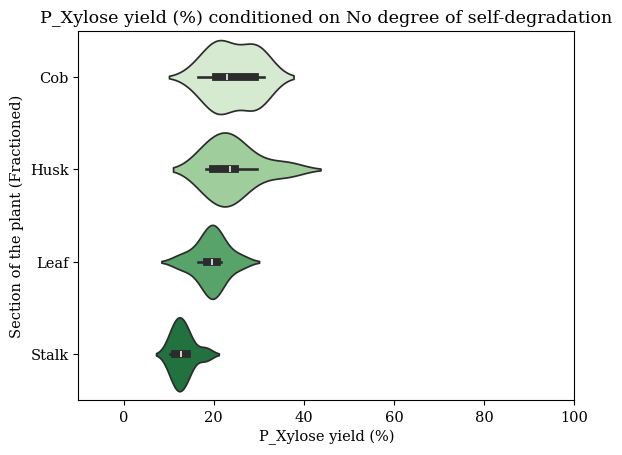

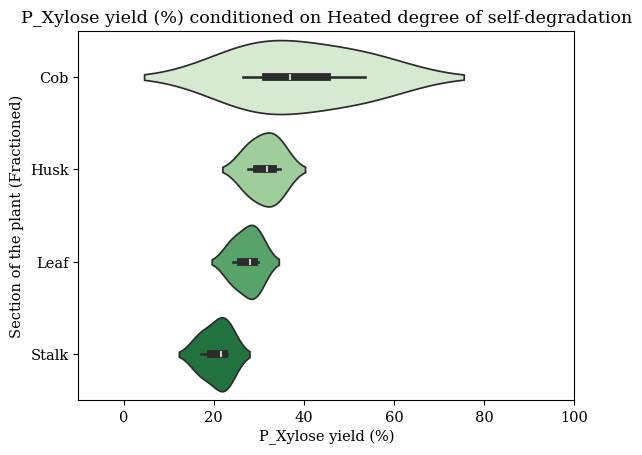

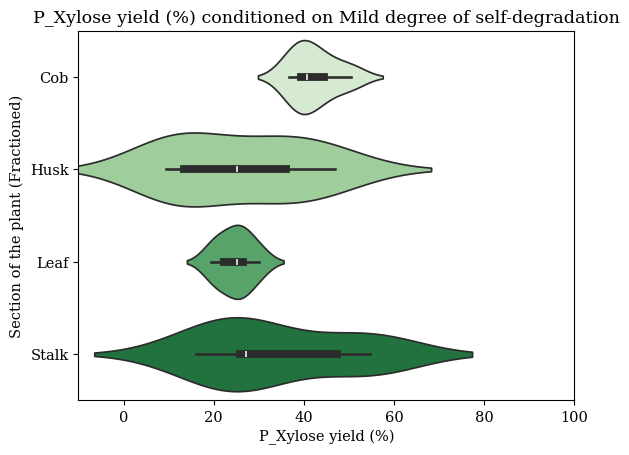

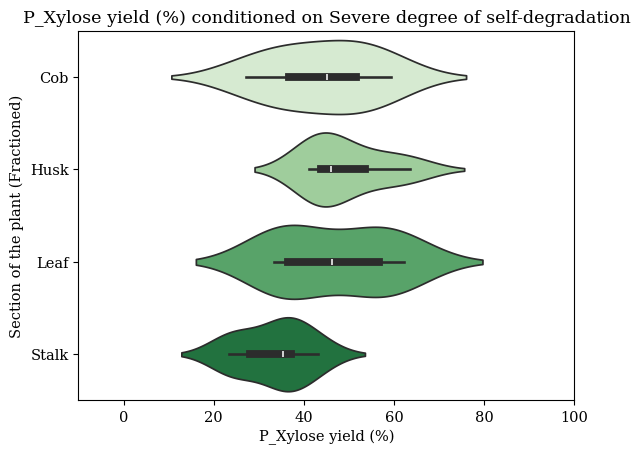

<Figure size 640x480 with 0 Axes>

In [ ]:
#Sugar yield grouped by degree of self-degradation and the section of the plant
counter = 0
for i in FY19_2[['R_Glucose yield (%)','R_Xylose yield (%)', 'P_Glucose yield (%)','P_Xylose yield (%)']]:
  for j in FY19_2['Self-heated'].unique():
    counter = counter + 1
    column = FY19_2[FY19_2['Self-heated'] == j][i]
    sns.violinplot(x = column, y="Section of the plant (Fractioned)",hue = "Section of the plant (Fractioned)", palette='Greens', data=FY19_2)
    plt.title(f"{i} conditioned on {j} degree of self-degradation")
    plt.xlim(-10,100)
    plt.figure()
print(counter)

<ipython-input-80-a2882c649e33>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


23


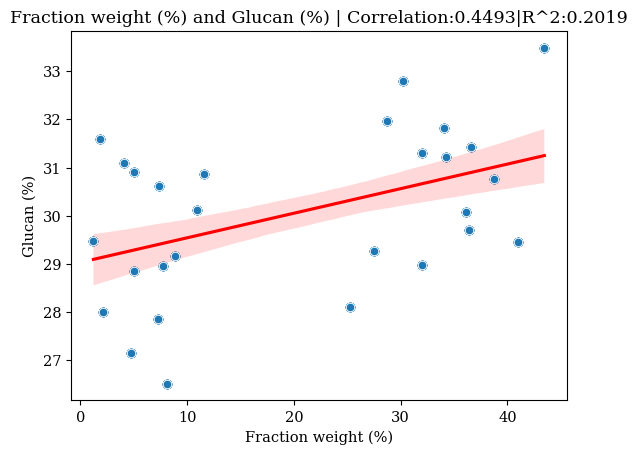

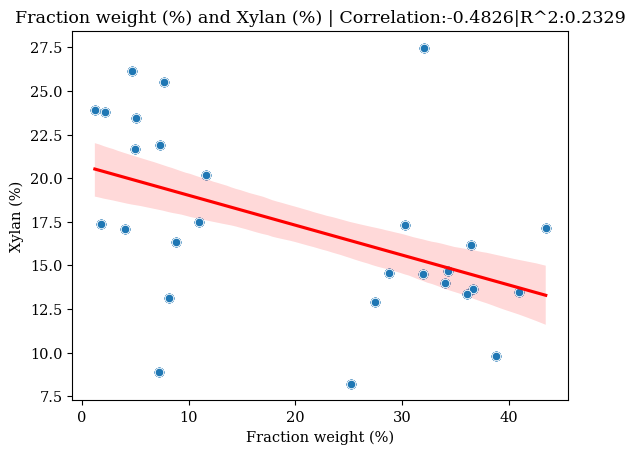

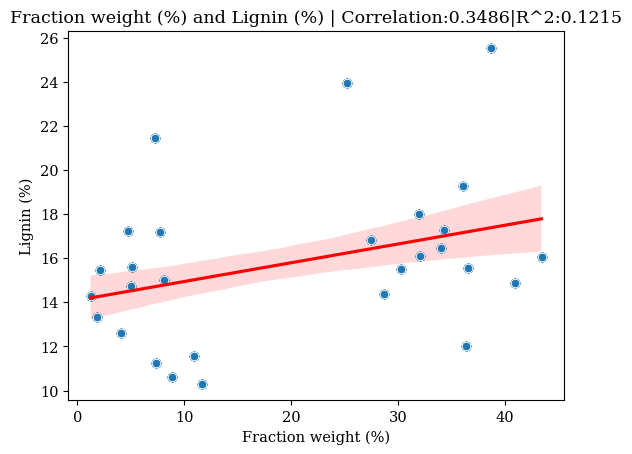

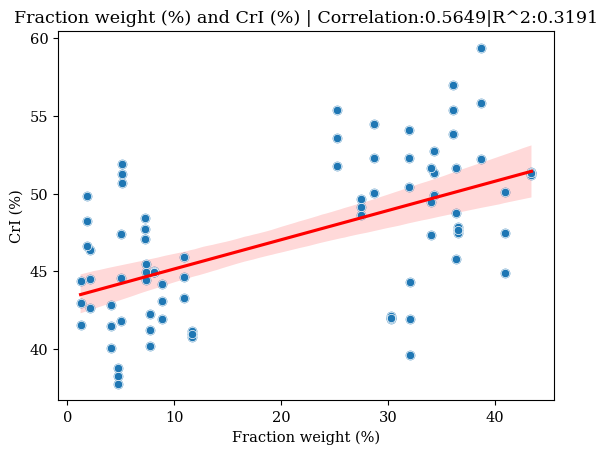

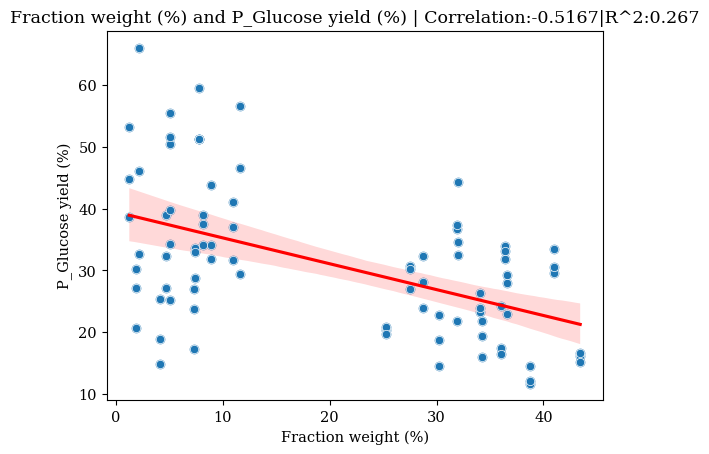

...

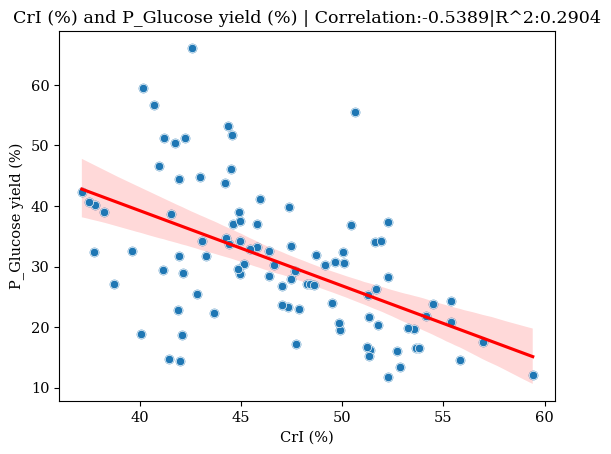

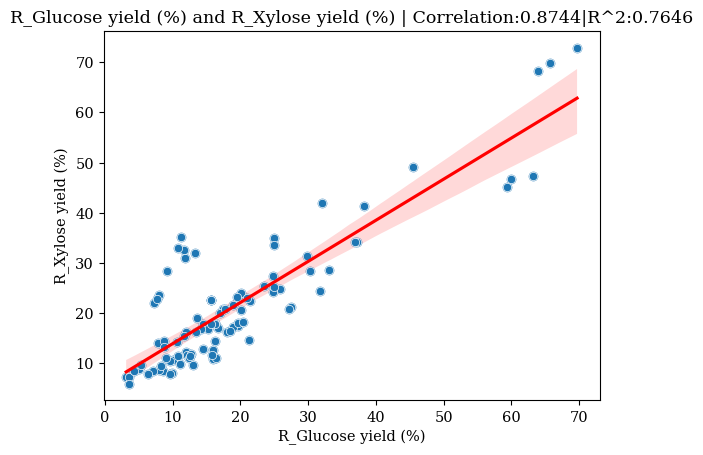

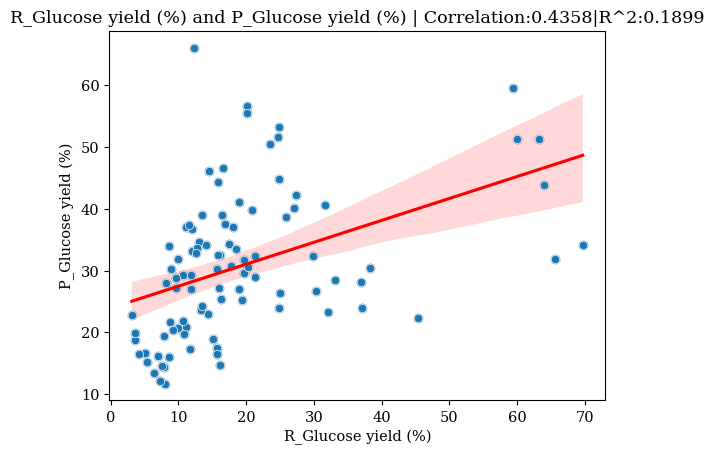

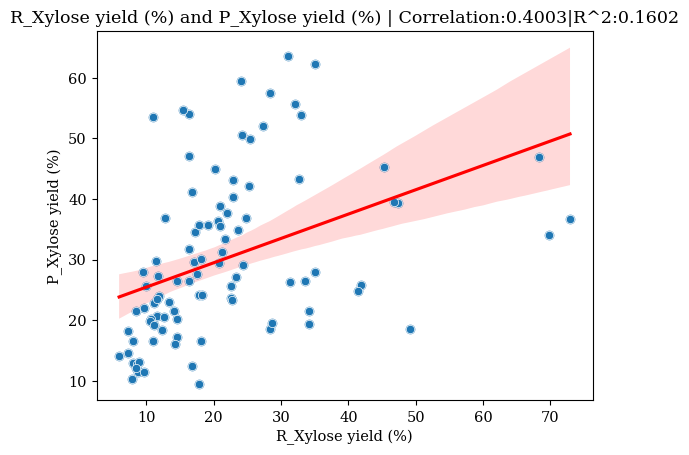

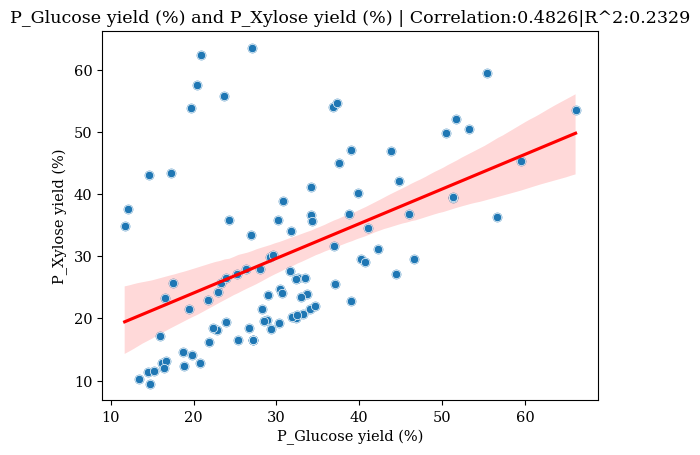

In [ ]:
year_19_columns = FY19_2.columns

counter = 0
for i in range(len(year_19_columns)):
  for j in range(i+1, len(year_19_columns)):
    col1 = year_19_columns[i]
    col2 = year_19_columns[j]
    try:
            FY19_2[col1] = FY19_2[col1].astype(float)
            FY19_2[col2] = FY19_2[col2].astype(float)
    except ValueError:
          continue
    if FY19_2[col1].dtype == 'float64' and FY19_2[col2].dtype == 'float64':
      correlation = round(FY19_2[[col1, col2]].corr().iloc[0,1],4)
      if abs(correlation * correlation) > 0.1:
        counter+=1
        plt.figure()
        sns.regplot(data=FY19_2, x=col1, y=col2, line_kws={'color': 'red'})
        plt.title(f'{col1} and {col2} | Correlation:{correlation}|R^2:{round(np.square(correlation),4)}')
        sns.scatterplot(data=FY19_2,x=col1,y=col2)
print(counter)

Text(0.5, 1.0, 'Heatmap of Correlations')

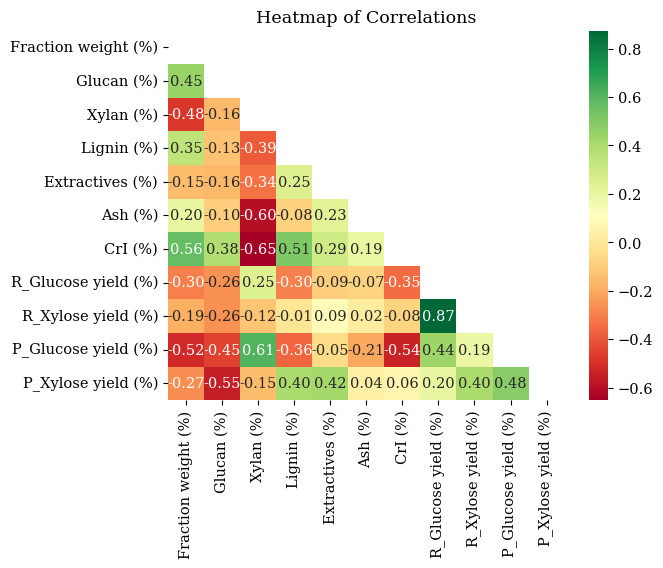

In [ ]:
float_columns = FY19_2.select_dtypes(include=['float64']).columns
corr_matrix = FY19_2[float_columns].corr()
#.where(np.abs(corr_matrix) >= 0.2,0)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of Correlations')

Text(0.5, 1.0, 'Heatmap of R^2 Scores')

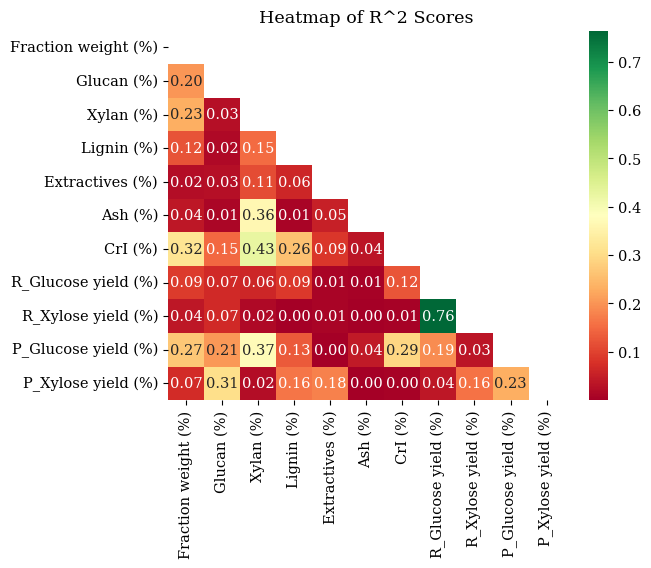

In [ ]:
float_columns = FY19_2.select_dtypes(include=['float64']).columns
r2_matrix = FY19_2[float_columns].corr()**2
#.where(np.abs(corr_matrix) >= 0.2,0)
mask = np.triu(np.ones_like(r2_matrix, dtype=bool))
sns.heatmap(r2_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of R^2 Scores')

-----------------------------------
## **Year 19 - Combined**

In [ ]:
FY19_comb = FY19_raw_combined.copy()

4


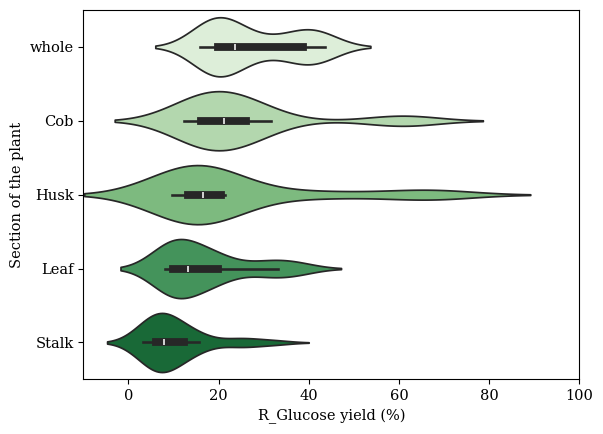

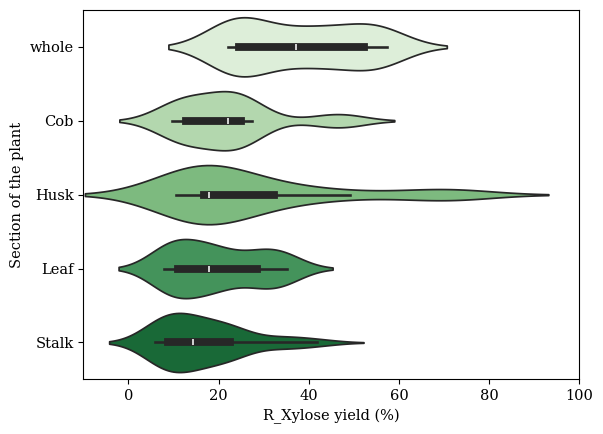

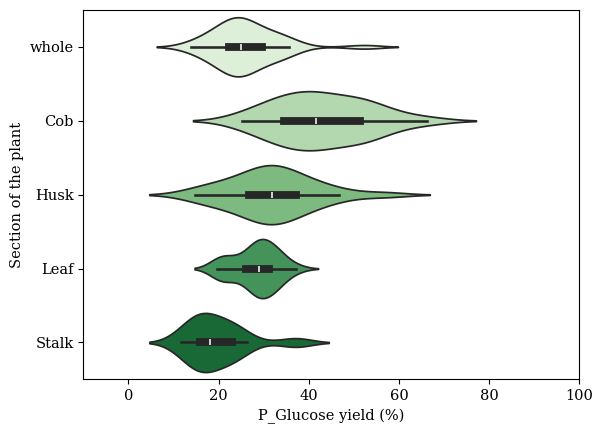

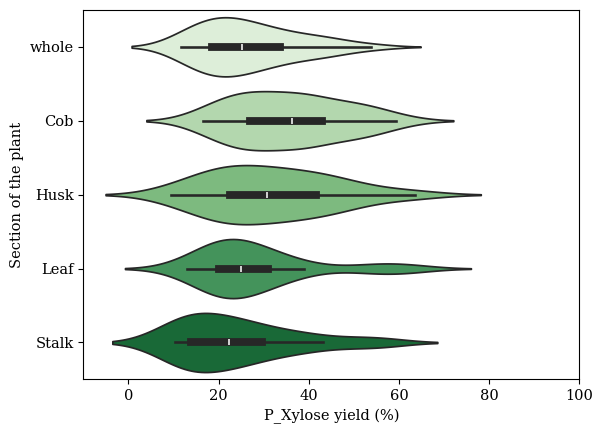

<Figure size 640x480 with 0 Axes>

In [ ]:
#Combining both fy19 datasets together
counter = 0
FY19_comb_sugar_columns = FY19_comb[['R_Glucose yield (%)','R_Xylose yield (%)', 'P_Glucose yield (%)','P_Xylose yield (%)']]
for i in FY19_comb_sugar_columns:
    counter = counter + 1
    col1 = FY19_comb[i]
    sns.violinplot(x = col1, y="Section of the plant",hue ="Section of the plant", palette = 'Greens', data=FY19_comb)
    plt.xlim(-10,100)
    plt.figure()
print(counter)

4


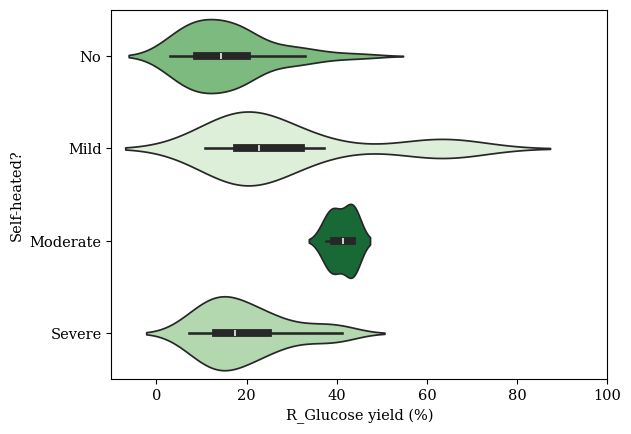

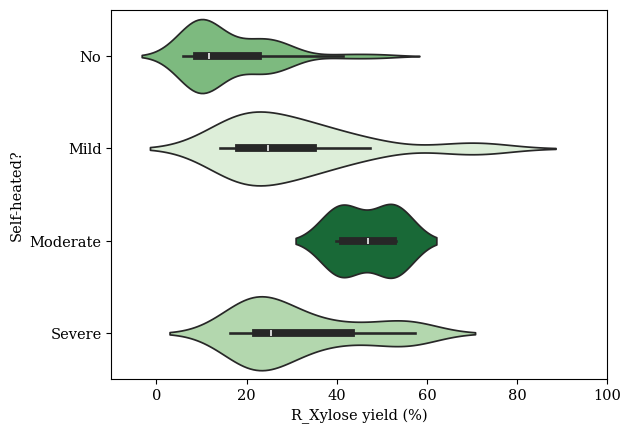

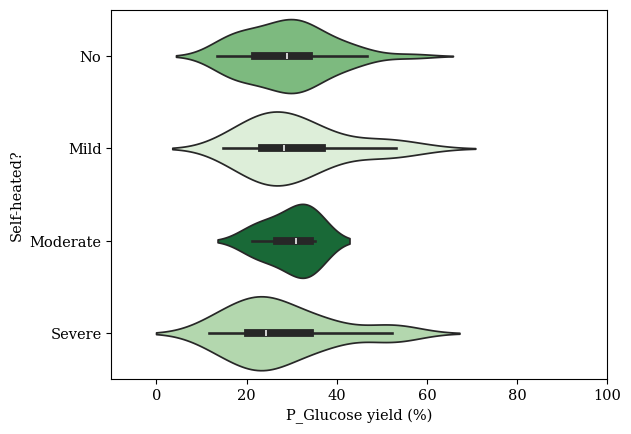

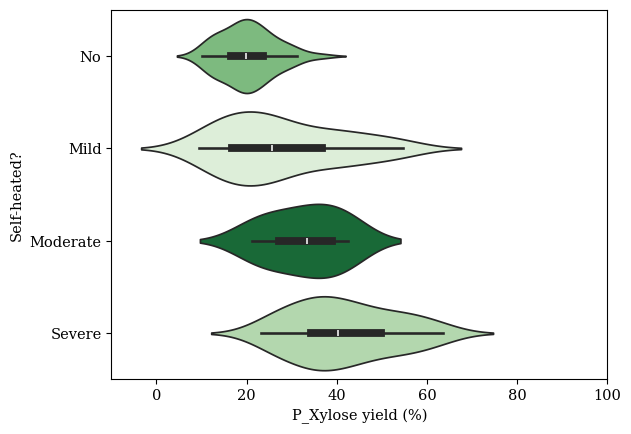

<Figure size 640x480 with 0 Axes>

In [ ]:
#Combined datasets grouped by degree of  self degragation
counter = 0
FY19_comb_no_heated = FY19_comb[FY19_comb['Self-heated?'] != 'Heated']
FY19_comb_sugar_columns = FY19_comb[['R_Glucose yield (%)','R_Xylose yield (%)', 'P_Glucose yield (%)','P_Xylose yield (%)']]
for i in FY19_comb_sugar_columns:
    counter = counter + 1
    col1 = FY19_comb_no_heated[i]
    sns.violinplot(x = col1, y="Self-heated?",hue = "Self-heated?",palette = 'Greens', data=FY19_comb,order = ['No','Mild','Moderate','Severe'])
    plt.xlim(-10,100)
    plt.figure()
print(counter)

9


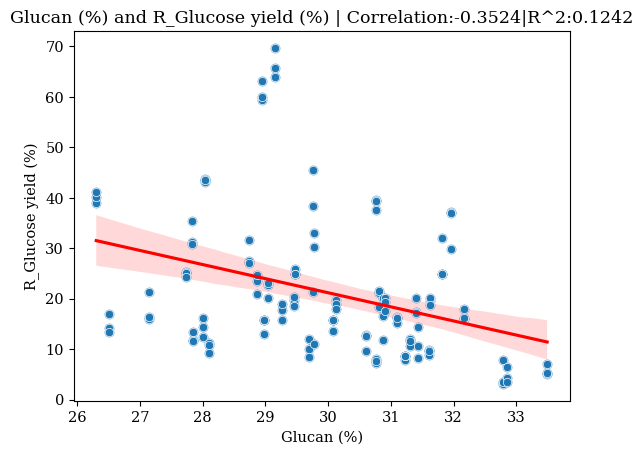

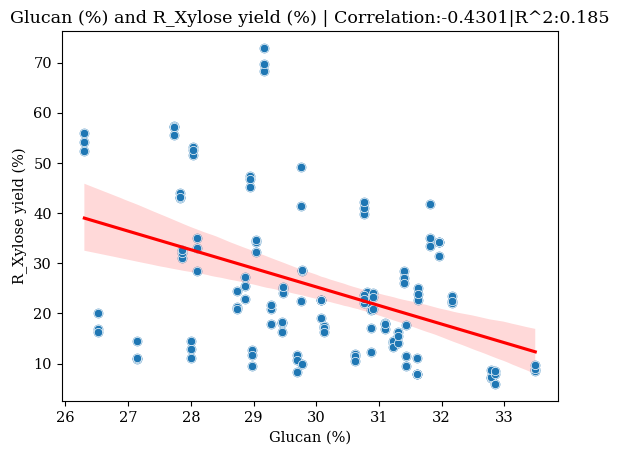

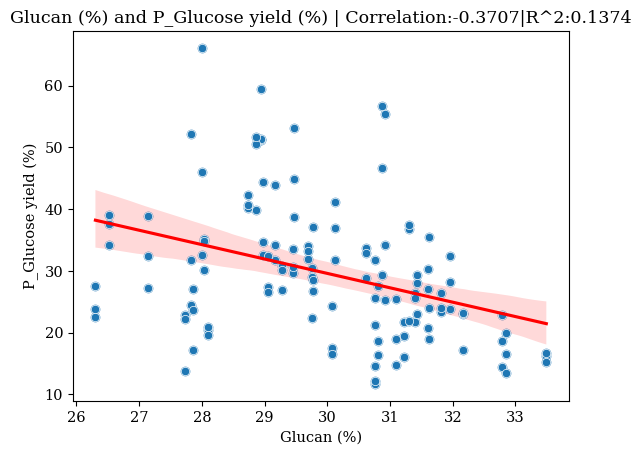

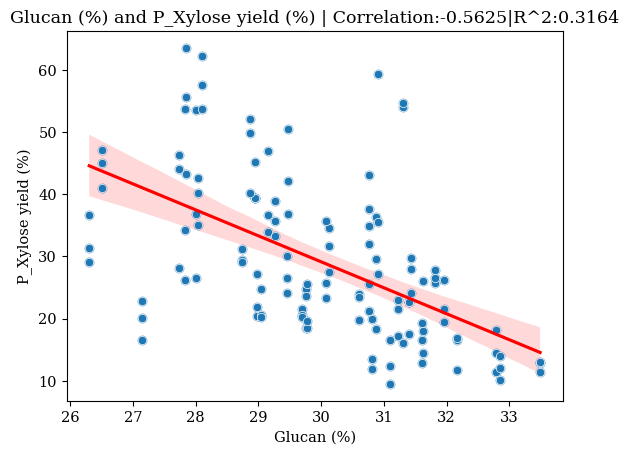

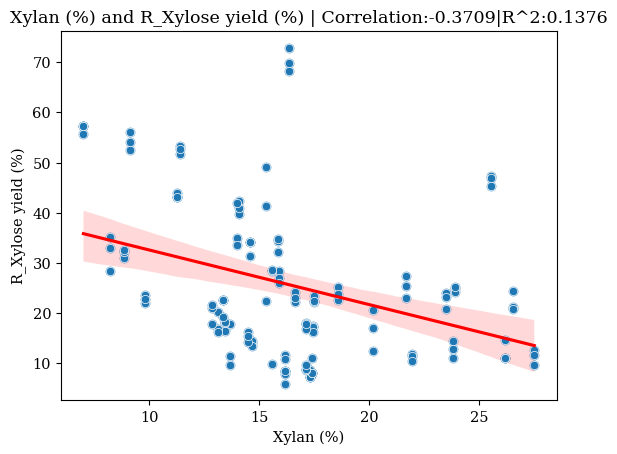

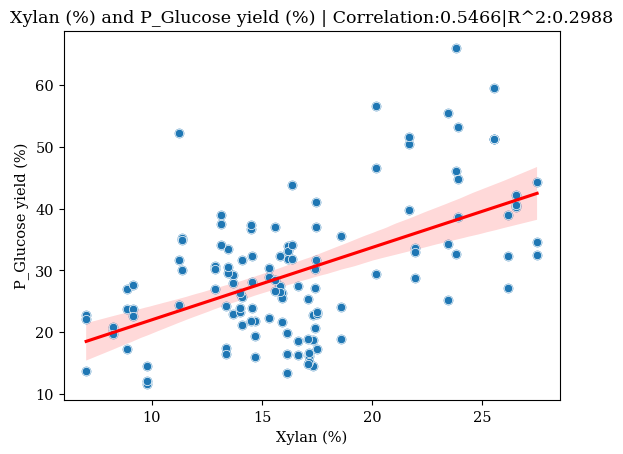

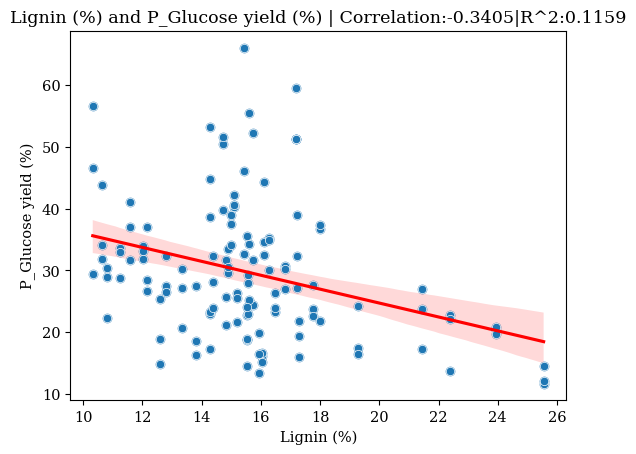

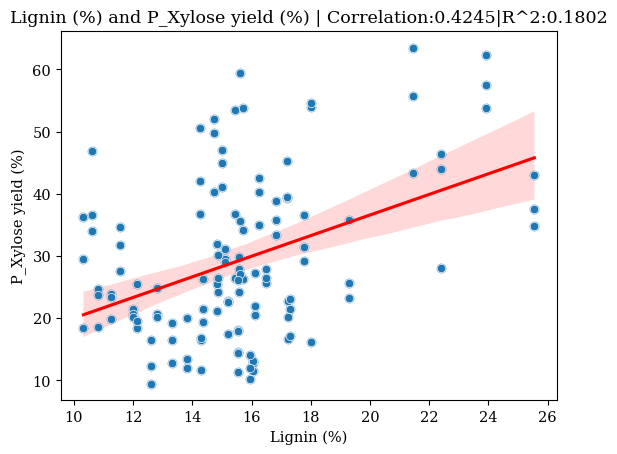

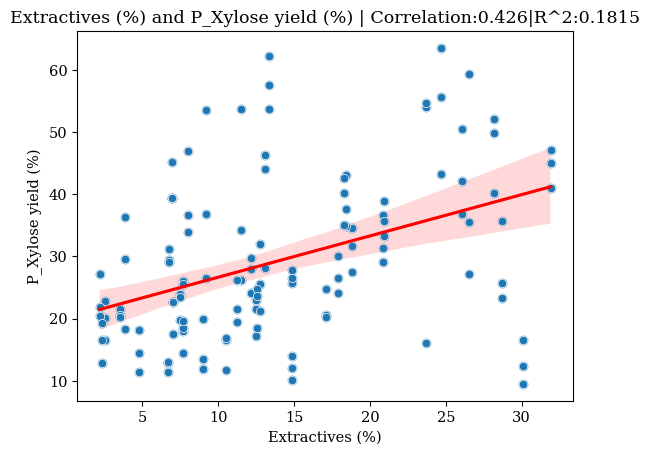

In [ ]:
combined_columns = FY19_comb.columns
FY19_comb_sugar_columns = FY19_comb[['R_Glucose yield (%)','R_Xylose yield (%)', 'P_Glucose yield (%)','P_Xylose yield (%)']]
FY19_comb_chemical_columns = FY19_comb[['Glucan (%)', 'Xylan (%)', 'Lignin (%)','Extractives (%)', 'Ash (%, 575C)']]
counter = 0
for i in FY19_comb_chemical_columns:
  for j in FY19_comb_sugar_columns:
    try:
            FY19_comb[i] = FY19_comb[i].astype(float)
            FY19_comb[j] = FY19_comb[j].astype(float)
    except ValueError:
          continue
    if FY19_comb[i].dtype == 'float64' and FY19_comb[j].dtype == 'float64':
      correlation = round(FY19_comb[[i, j]].corr().iloc[0,1],4)
      if abs(correlation * correlation) > 0.1:
        counter+=1
        plt.figure()
        sns.regplot(data=FY19_comb, x=i, y=j, line_kws={'color': 'red'})
        plt.title(f'{i} and {j} | Correlation:{correlation}|R^2:{round(np.square(correlation),4)}')
        sns.scatterplot(data=FY19_comb,x=i,y=j)
print(counter)

Text(0.5, 1.0, 'Correlation_pretreated:-0.4915|Correlation_As_is:-0.253|R^2_Pretreated:0.2416|R^2_As_is:0.064')

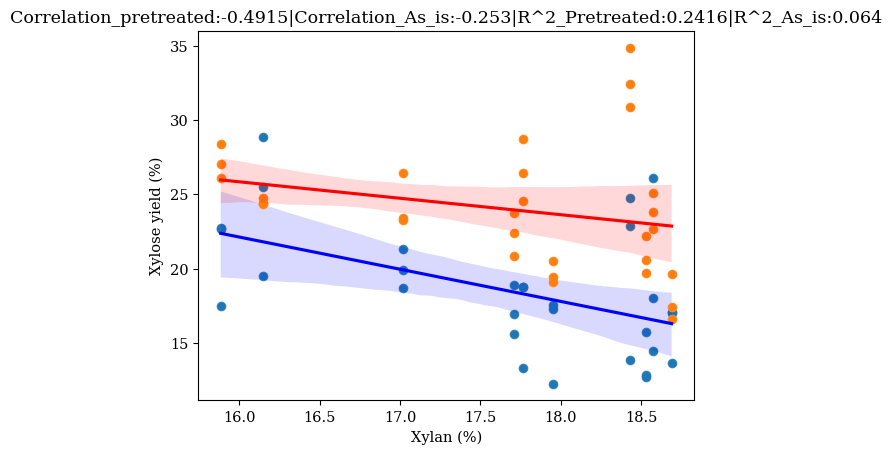

In [ ]:
sns.scatterplot(data=FY18, x='Xylan (%)', y='P_Xylose yield (%)')
sns.regplot(data=FY18, x='Xylan (%)', y='P_Xylose yield (%)', line_kws={'color': 'blue'})
sns.scatterplot(data=FY18, x='Xylan (%)', y='R_Xylose yield (%)')
sns.regplot(data=FY18, x='Xylan (%)', y='R_Xylose yield (%)', line_kws={'color': 'red'})
correlation_pretreated = round(FY18[['Xylan (%)', 'P_Xylose yield (%)']].corr().iloc[0,1],4)
correlation_asis = round(FY18[['Xylan (%)', 'R_Xylose yield (%)']].corr().iloc[0,1],4)

plt.ylabel('Xylose yield (%)')
plt.title(f'Correlation_pretreated:{correlation_pretreated}|Correlation_As_is:{correlation_asis}|R^2_Pretreated:{np.round(correlation_pretreated**2,4)}|R^2_As_is:{np.round(correlation_asis**2,4)}')
# Red is "As is Xylose yield (%)"" and blue is 'Pretreated Xylose yield (%)'

<ipython-input-90-293f142ccf3d>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


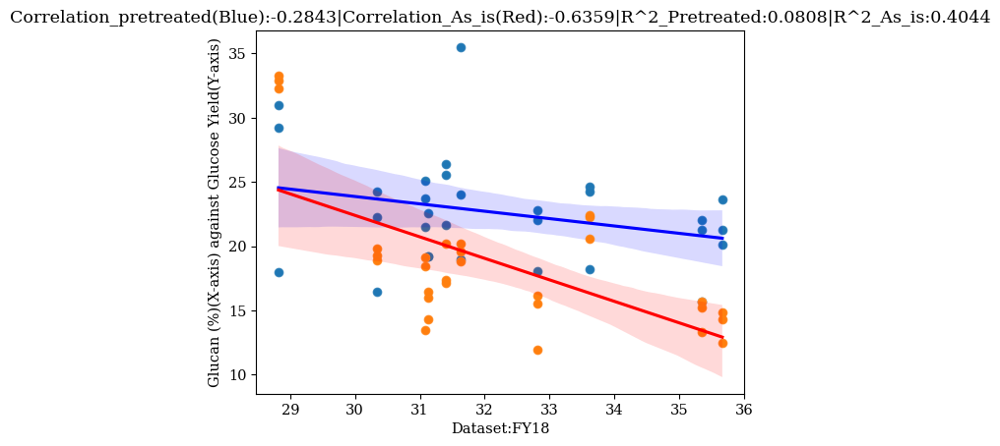

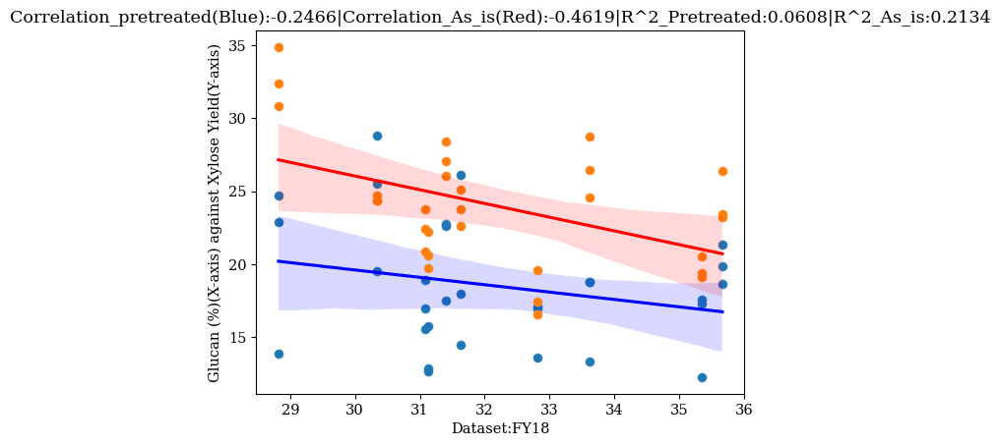

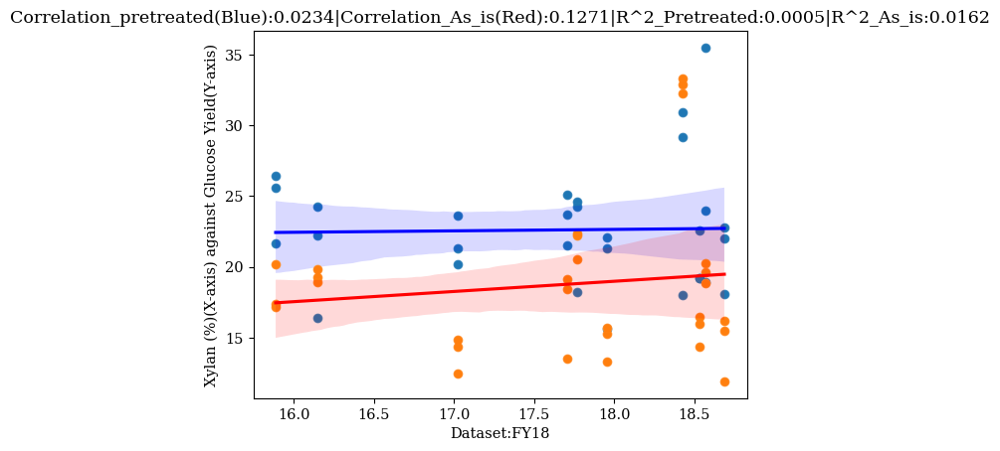

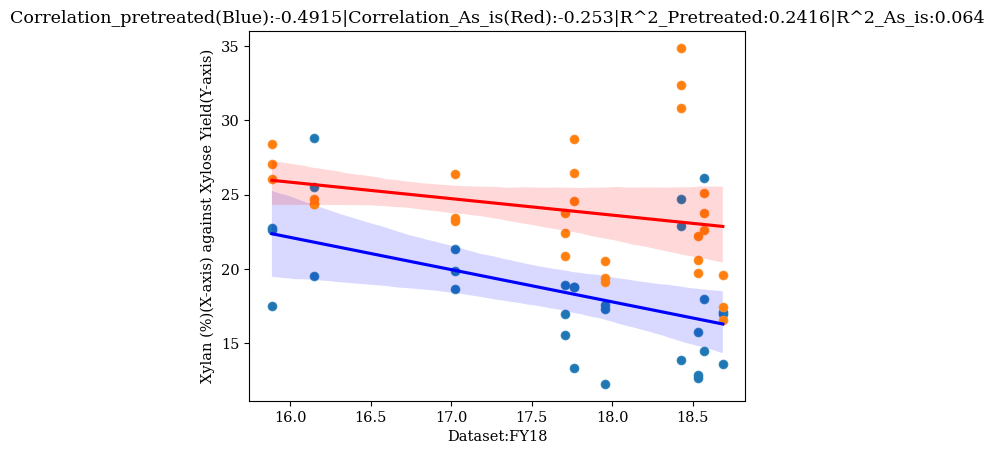

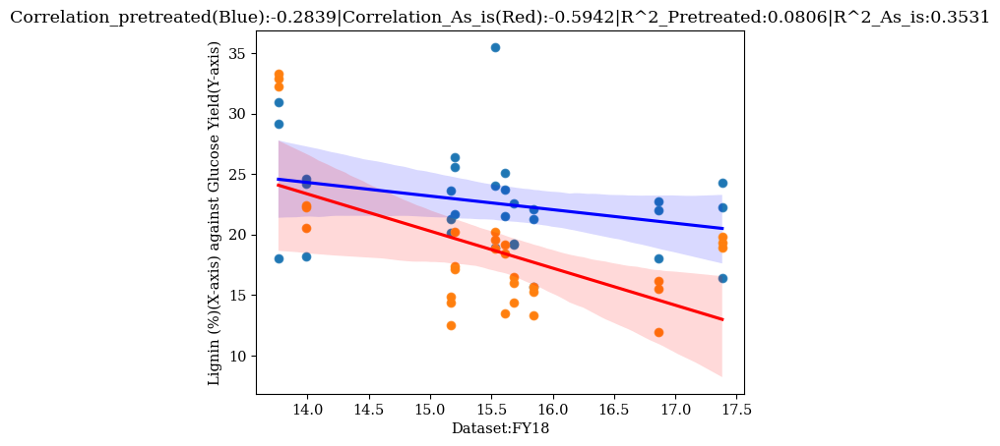

...

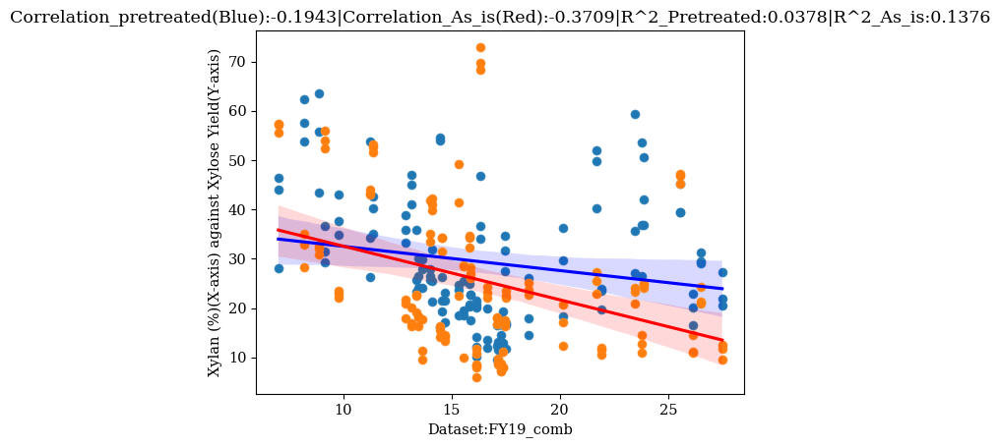

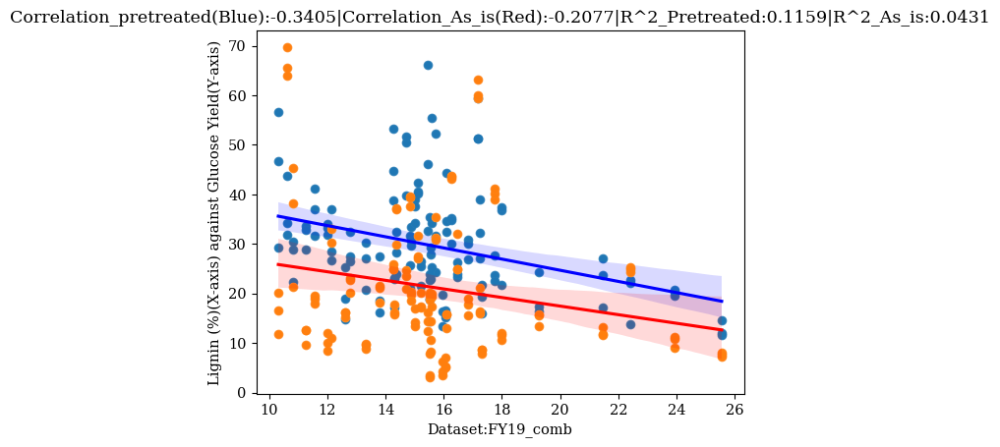

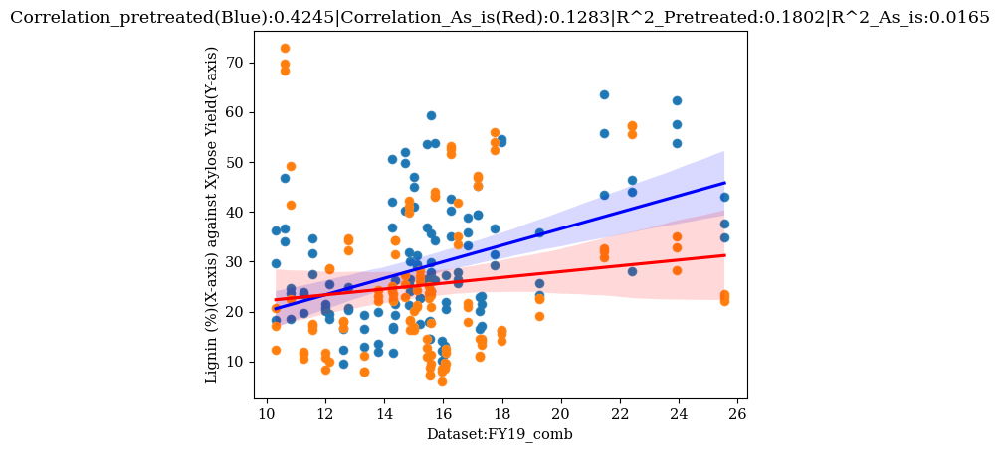

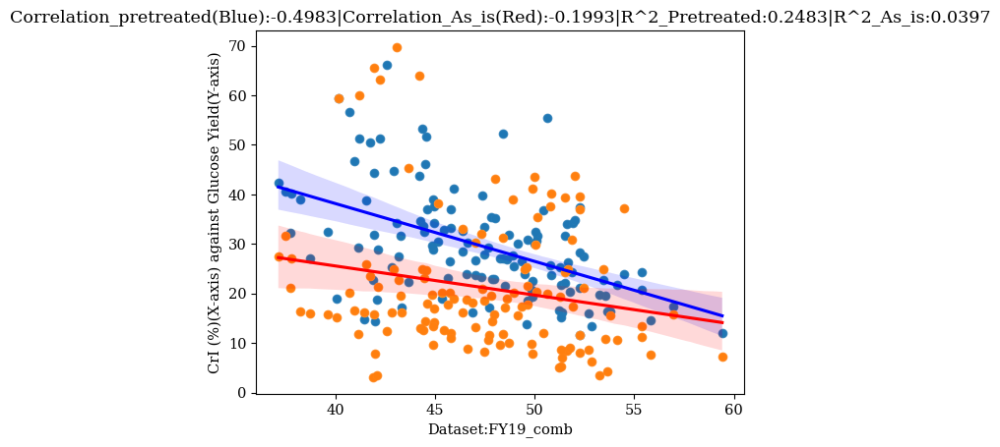

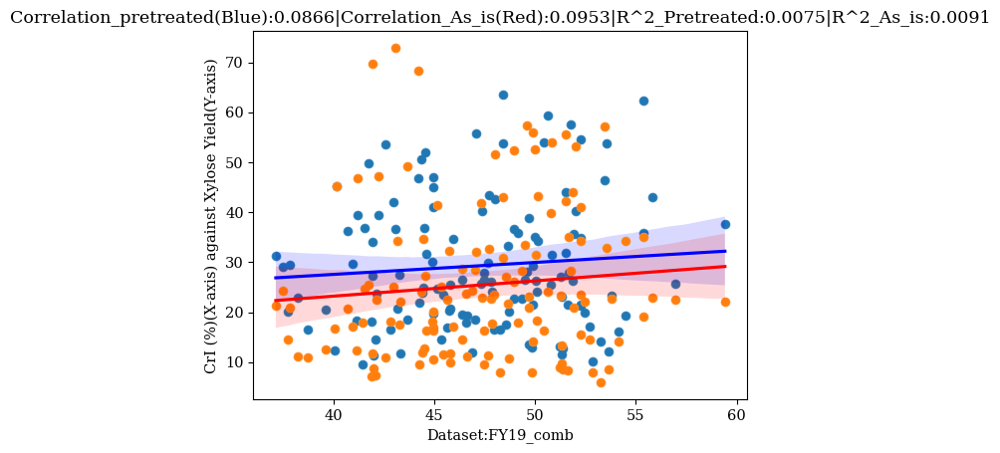

In [ ]:
#Correlation between sugar yield and various components, separated between stovers that receive pretreatment and stovers that doesn't
counter = -1
datas = ["FY18","FY19_1","FY19_2","FY19_comb"]
for dataset in [FY18,FY19_1,FY19_2,FY19_comb]:
  counter += 1
  for i in ['Glucan (%)', 'Xylan (%)','Lignin (%)', 'CrI (%)']:
    sugar = ['Glucose Yield',"Xylose Yield"]
    sugar_count = 0
    for j in [['P_Glucose yield (%)','R_Glucose yield (%)'],['P_Xylose yield (%)','R_Xylose yield (%)']]:
      plt.figure()
      sns.scatterplot(data=dataset, x=i, y=j[0])
      sns.regplot(data=dataset, x=i, y=j[0], line_kws={'color': 'blue'})
      sns.scatterplot(data=dataset, x=i, y=j[1])
      sns.regplot(data=dataset, x=i, y=j[1], line_kws={'color': 'red'})
      correlation_pretreated = round(dataset[[i, j[0]]].corr().iloc[0,1],4)
      correlation_asis = round(dataset[[i, j[1]]].corr().iloc[0,1],4)
      plt.title(f'Correlation_pretreated(Blue):{correlation_pretreated}|Correlation_As_is(Red):{correlation_asis}|R^2_Pretreated:{np.round(correlation_pretreated**2,4)}|R^2_As_is:{np.round(correlation_asis**2,4)}')
      plt.xlabel(f'Dataset:{datas[counter]}')
      plt.ylabel(f'{i}(X-axis) against {sugar[sugar_count]}(Y-axis)')
      sugar_count += 1

Text(0.5, 1.0, 'Heatmap of Correlations')

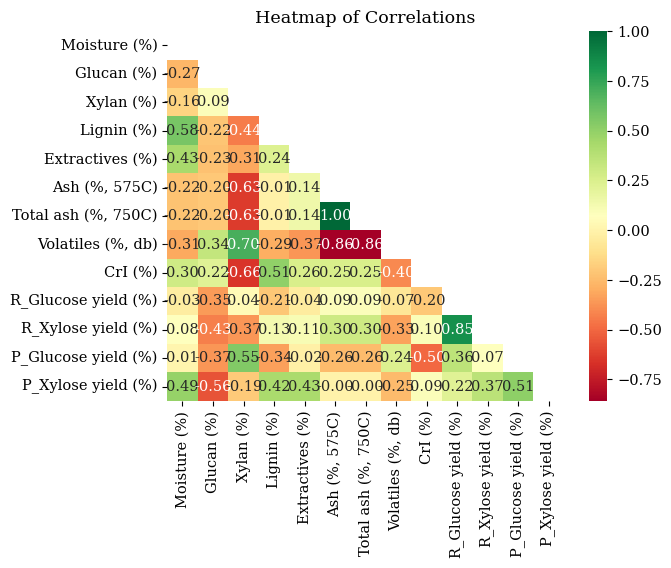

In [ ]:
#Heatmap of correlation for the FY19_combined data
float_columns = FY19_comb.select_dtypes(include=['float64']).columns
corr_matrix = FY19_comb[float_columns].corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of Correlations')

Text(0.5, 1.0, 'Heatmap of R^2 Scores')

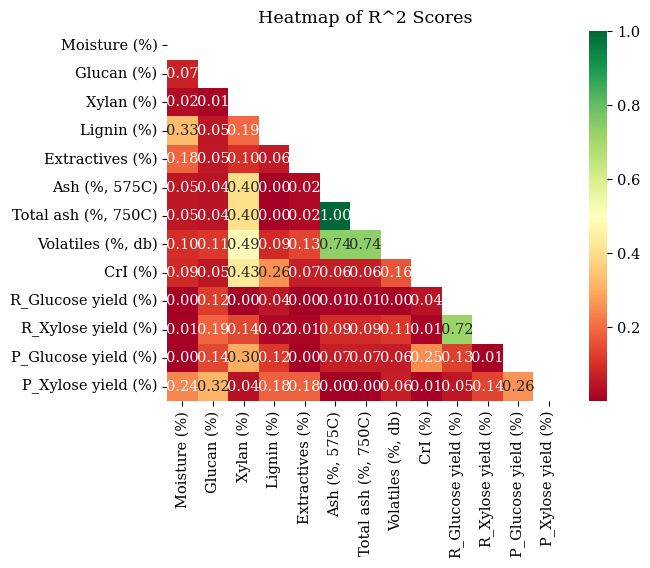

In [ ]:
#Heatmap of R^2 for the FY19_combined data
float_columns = FY19_comb.select_dtypes(include=['float64']).columns
r2_matrix = FY19_comb[float_columns].corr()**2
mask = np.triu(np.ones_like(r2_matrix, dtype=bool))
sns.heatmap(r2_matrix, annot=True, fmt='.2f', cmap='RdYlGn',mask=mask)
plt.title('Heatmap of R^2 Scores')